# Part I-Dataset Exploration Homicide Reports Dataset
### by Layla Alsaabna


## Introduction

The dataset is from kaggle, [Homicide Reports, 1980-2014](https://www.kaggle.com/datasets/murderaccountability/homicide-reports)


This dataset includes murders from the FBI's Supplementary Homicide Report from 1976 to the present and Freedom of Information Act data on more than 22,000 homicides that were not reported to the Justice Department. This dataset includes the age, race, sex, ethnicity of victims and perpetrators, in addition to the relationship between the victim and perpetrator and weapon used.


This dataset contains detailed information on homicide reports. Each row represents a single incident. Below is a description of each variable in the dataset:

| Variable              | Description                                                                  |
|-----------------------|------------------------------------------------------------------------------|
| **Record ID**         | A unique identifier for each record in the dataset.                          |
| **Agency Code**       | The code assigned to the law enforcement agency that reported the homicide.  |
| **Agency Name**       | The name of the law enforcement agency that reported the homicide.           |
| **Agency Type**       | The type of the law enforcement agency (e.g., Municipal Police, Sheriff's Office). |
| **City**              | The city where the homicide occurred.                                        |
| **State**             | The state where the homicide occurred.                                       |
| **Year**              | The year when the homicide occurred.                                         |
| **Month**             | The month when the homicide occurred.                                        |
| **Incident**          | A 3-digits unique identifier for the incident.                                        |
| **Crime Type**        | The type of crime committed (e.g., Murder or Manslaughter).                  |
| **Crime Solved**      | Indicates whether the crime was solved (`Yes` or `No`).                      |
| **Victim Sex**        | The sex of the victim (`Male` or `Female`).                                  |
| **Victim Age**        | The age of the victim.                                                       |
| **Victim Race**       | The race of the victim (e.g., White, Black, Asian, Native American).         |
| **Victim Ethnicity**  | The ethnicity of the victim (e.g., Hispanic, Non-Hispanic).                  |
| **Perpetrator Sex**   | The sex of the perpetrator (`Male`, `Female`, `Unknown`).                    |
| **Perpetrator Age**   | The age of the perpetrator.                                                  |
| **Perpetrator Race**  | The race of the perpetrator (e.g., White, Black, Asian, Native American).    |
| **Perpetrator Ethnicity** | The ethnicity of the perpetrator (e.g., Hispanic, Non-Hispanic).         |
| **Relationship**      | The relationship between the victim and the perpetrator (e.g., Acquaintance, Stranger, Family). |
| **Weapon**            | The type of weapon used in the homicide (e.g., Firearm, Knife, Blunt Object).|
| **Victim Count**      | The number of additional victims (not counting the victim included in the currentrecord) |
| **Perpetrator Count** | The number of additional offenders (not counting the offender included in thecurrent record)    |
| **Record Source**     | The source of the record (e.g., FBI).                                        |




## Preliminary Wrangling

In [1]:
# import all packages and set plots to be embedded inline
import pandas as pd 
import numpy as np 
import matplotlib.pyplot as plt 
import seaborn as sns
from sklearn.impute import SimpleImputer
from sklearn import set_config 

In [155]:
# To insure the output os a dataframe
set_config(transform_output = 'pandas')

In [3]:
# Load the dataset 
df = pd.read_csv("databasee.csv")

C:\Users\HITECH\AppData\Local\Temp\ipykernel_20980\2214917056.py:2: DtypeWarning: Columns (13) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv("databasee.csv")


In [5]:
# Display the first few rows of the dataframe
df.head()

,Unnamed: 0.1,Unnamed: 0,Agency Name,City,State,Year,Month,Crime Solved,Victim Sex,Victim Age,Victim Race,Victim Ethnicity,Perpetrator Sex,Perpetrator Age,Perpetrator Race,Perpetrator Ethnicity,Relationship,Weapon
0,0,0,Anchorage,Anchorage,Alaska,1980,January,Yes,Male,14,Native American/Alaska Native,Unknown,Male,15,Native American/Alaska Native,Unknown,Acquaintance,Blunt Object
1,1,1,Anchorage,Anchorage,Alaska,1980,March,Yes,Male,43,White,Unknown,Male,42,White,Unknown,Acquaintance,Strangulation
2,2,2,Anchorage,Anchorage,Alaska,1980,March,No,Female,30,Native American/Alaska Native,Unknown,Unknown,0,Unknown,Unknown,Unknown,Unknown
3,3,3,Anchorage,Anchorage,Alaska,1980,April,Yes,Male,43,White,Unknown,Male,42,White,Unknown,Acquaintance,Strangulation
4,4,4,Anchorage,Anchorage,Alaska,1980,April,No,Female,30,Native American/Alaska Native,Unknown,Unknown,0,Unknown,Unknown,Unknown,Unknown


In [14]:
# dRopping 'Record ID' and 'Record Source', 'Perpetrator Count', 'Victim Count', 'Agency Code', 'Agency Type', 'Incident', 'Crime Type'
df.drop(axis = 1, columns  = ['Agency Code', 'Agency Type', 'Incident', 'Crime Type'], inplace = True)

In [15]:
df.to_csv("databasee.csv")

In [7]:
# high-level overview of data shape and composition
print(f"The dataset has {df.shape[0]:,} records, and {df.shape[1]:,} features.")

The dataset has 638,454 records, and 18 features.


In [8]:
df.dtypes

Unnamed: 0.1              int64
Unnamed: 0                int64
Agency Name              object
City                     object
State                    object
Year                      int64
Month                    object
Crime Solved             object
Victim Sex               object
Victim Age                int64
Victim Race              object
Victim Ethnicity         object
Perpetrator Sex          object
Perpetrator Age          object
Perpetrator Race         object
Perpetrator Ethnicity    object
Relationship             object
Weapon                   object
dtype: object

In [9]:
# Here the Perpetrator Age is not numeric, using pd.to_numeric function because this column has nan values 
df['Perpetrator Age'] = pd.to_numeric(df['Perpetrator Age'], errors='coerce')
# Then we will fill the nan values with zero for imputing proccess later
df['Perpetrator Age'].fillna(0, inplace=True) 


C:\Users\HITECH\AppData\Local\Temp\ipykernel_20980\2442970391.py:4: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df['Perpetrator Age'].fillna(0, inplace=True)


In [10]:
# Let's check for the overall statistics for every numeric column : 
df.describe()

,Unnamed: 0.1,Unnamed: 0,Year,Victim Age,Perpetrator Age
count,638454.00000,638454.00000,638454.000000,638454.000000,638454.000000
mean,319226.50000,319226.50000,1995.801102,35.033512,20.322665
std,184305.93872,184305.93872,9.927693,41.628306,17.886846
min,0.00000,0.00000,1980.000000,0.000000,0.000000
25%,159613.25000,159613.25000,1987.000000,22.000000,0.000000
50%,319226.50000,319226.50000,1995.000000,30.000000,21.000000
75%,478839.75000,478839.75000,2004.000000,42.000000,31.000000
max,638453.00000,638453.00000,2014.000000,998.000000,99.000000


For the Victim Age column values = 998, looking at the data dictionary from the [Murder Accountability Project](https://www.murderdata.org/p/data-docs.html), I found that they use a code of 999 to represent victims whose age was not reported, usually because the victim was unidentified and the age was unknown. The value 998 is probably used in place of 999 in this dataset, and for ages = 0, MAP(Murder Accountability Project) has changed the original alphanumeric coding of “NB” for new born and “BB” for infant to a numeric value of **zero** to indicate the victim had not achieved a full year of life.

And for the Perpetrator Age	 the min value is also 0 and the max value is 99 which is pretty confusing, from the [Murder Accountability Project](https://www.murderdata.org/p/data-docs.html), A value of 99 represents all offenders 99 or older.


### What is the structure of your dataset?

> The dataset has 638,454 records, and 24 features.Most features are non-numeric, some are categorical and only [Record ID, Year, Incident, Victim Age, Victim Count, Perpetrator Count]


### What is/are the main feature(s) of interest in your dataset?

> I'm most interested in figuring out the best features that are best for discovering the trends over time.

### What features in the dataset do you think will help support your investigation into your feature(s) of interest?

>  ['Record ID', 'Agency Code', 'Agency Name', 'Agency Type', 'City',
       'State', 'Year', 'Month', 'Incident', 'Crime Type', 'Crime Solved',
       'Victim Sex', 'Victim Age', 'Victim Race', 'Victim Ethnicity',
       'Perpetrator Sex', 'Perpetrator Age', 'Perpetrator Race',
       'Perpetrator Ethnicity', 'Relationship', 'Weapon', 'Victim Count',
       'Perpetrator Count', 'Record Source']

## Univariate Exploration
In this section we will use programmatic and visual assessments to investigate distributions of individual variables.
I'll start by looking at the distribution of the variable : Year

In [11]:


def plot_histogram_with_stats(df, column_name, color = 'tab:blue', bins = 20):
    """
    Plots a histogram for the specified column in the DataFrame and adds vertical lines for median and mean.

    Parameters:
    df (pd.DataFrame): The DataFrame containing the data.
    column_name (str): The name of the column to plot.
    """
    
    # Plot the histogram
    ax = df[column_name].plot(kind='hist', edgecolor='black', title=f'Histogram of {column_name}', color = color, bins = bins)
    
    # Calculate median and mean
    median = df[column_name].median()
    mean = df[column_name].mean()
    
    # Add vertical lines for median and mean
    ax.axvline(median, color='r', linestyle='--', linewidth=1, label='Median')
    ax.axvline(mean, color='b', linestyle='--', linewidth=1, label='Mean')
    
    # Add a legend
    plt.legend()
    
   


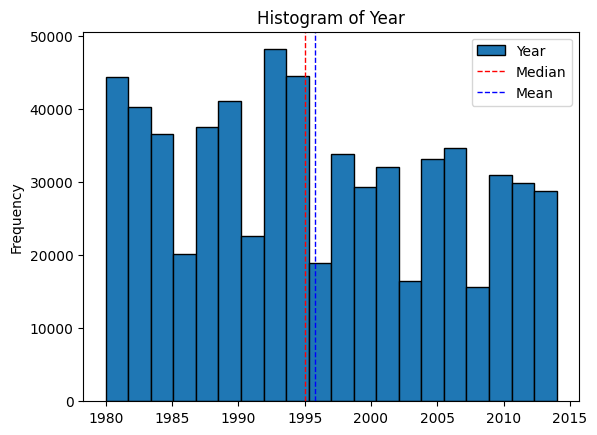

In [12]:
# start with a hist plot for Year column
plot_histogram_with_stats(df, 'Year')


As shown in the figure it looks like the range from 1992 to 1993 has the most records of homicide data, is it that these years had the most crimes?,
or is it just that about gathering the data?

In [13]:
color = sns.color_palette()
color

[(0.12156862745098039, 0.4666666666666667, 0.7058823529411765),
 (1.0, 0.4980392156862745, 0.054901960784313725),
 (0.17254901960784313, 0.6274509803921569, 0.17254901960784313),
 (0.8392156862745098, 0.15294117647058825, 0.1568627450980392),
 (0.5803921568627451, 0.403921568627451, 0.7411764705882353),
 (0.5490196078431373, 0.33725490196078434, 0.29411764705882354),
 (0.8901960784313725, 0.4666666666666667, 0.7607843137254902),
 (0.4980392156862745, 0.4980392156862745, 0.4980392156862745),
 (0.7372549019607844, 0.7411764705882353, 0.13333333333333333),
 (0.09019607843137255, 0.7450980392156863, 0.8117647058823529)]

In [14]:
color4 = color[4]
color2 = color[2] 
color5 = color[5]
color6 = color[6]
color7 = color[7]


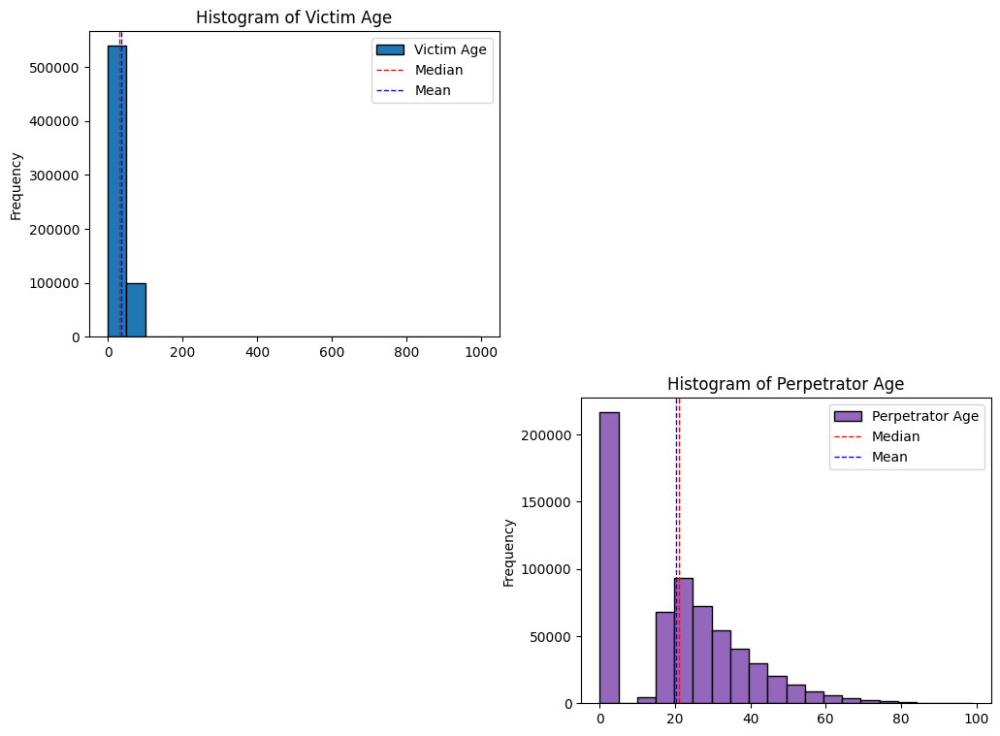

In [15]:
# plotting Victim Age and Perpetrator Age  on a standard scale

plt.figure(figsize=[12, 9])

# the Victim Age column
plt.subplot(2, 2, 1)
plot_histogram_with_stats(df, 'Victim Age')

# the Perpetrator Age column
plt.subplot(2, 2, 4)
plot_histogram_with_stats(df, 'Perpetrator Age', color4)

The Perpetrator Age column has a large number of values in the range 0-15 which could indicate to missing values or outliers, same for Victim Age column it seems there's an outliers that cause the plot to have one bin (0-100) maybe there are points that are close to 1000 on x axis.

<Axes: >

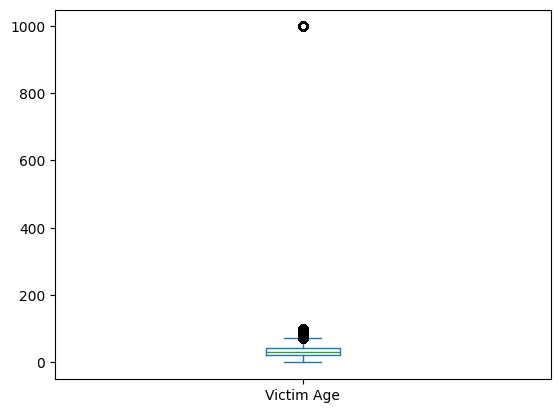

In [16]:
# Since Victim Age column has outliers, let's first use box plot
df['Victim Age'].plot(kind = 'box')

Apparently the point with 998 value is the code for unknown ages, so nan. 

For the hist plot for the Victim Age column let's zoom in on the x-axis and set the limit to 0 - 70, so we can better understand the distribution of the column in that area, and spot other issues.

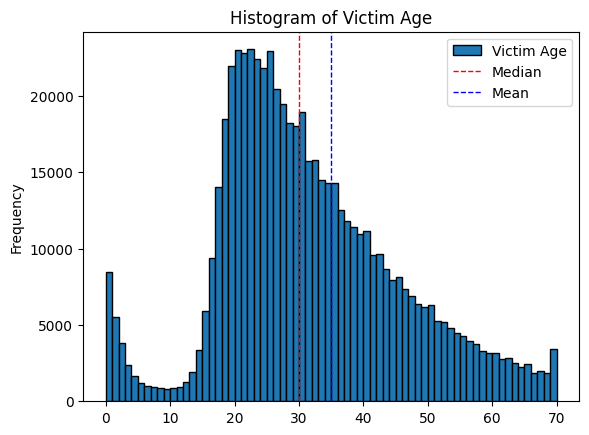

In [17]:
# Let's set the max value to be 70 
binsize = 1
bins = np.arange(df['Victim Age'].min(), 70+binsize, binsize)
plot_histogram_with_stats(df, 'Victim Age', bins = bins);


From the plot above we can see that the distribution is right skewed and there's pretty large number of zero values in the data, and peak in the range ~5 to 13 but overall the most values of the data between age 20 to 34.

As a victim you could die at any age and it's possible to have victims with zero years as age but since the distinction between victims below one year of age and potential data entry errors is not clear, for this sake no values below one, and no values greater than 90, While people can live more than 90 years, the probability of them being victims of crimes decreases significantly, extremely high ages could potentially represent data entry errors or outliers, and lastly to maintain focus on the more relevant age range for criminal analysis, we exclude ages above 100 years.


In [18]:
# Let's check the outliers
outliers = df['Victim Age'][(df['Victim Age'] > 90) | (df['Victim Age'] < 1)]
outliers

7          99
295         0
348        99
381         0
566         0
         ... 
638401    998
638417    998
638419    998
638451      0
638453      0
Name: Victim Age, Length: 19511, dtype: int64

In [19]:
# using Simple Imputer from sklearn, for the Victim Age i will use the mean imputer since the shape of the Victim Age column distribution has a high peak at the range 
# 20-34 so imputing the outliers/missing values (zeros) with these values is good choise.
# First to use SimpleImputer we have to convert the range we chose to np.nan

df['Victim Age'] = df['Victim Age'].apply(lambda x:np.nan if x < 1 or x > 90 else x)
# Let's check its statistics using .describe
df['Victim Age'].describe()


count    618943.000000
mean         32.960665
std          15.538801
min           1.000000
25%          22.000000
50%          30.000000
75%          41.000000
max          90.000000
Name: Victim Age, dtype: float64

In [20]:
mean_imputer = SimpleImputer(missing_values = np.nan, strategy = 'mean')
df['Victim Age'] = mean_imputer.fit_transform(df[['Victim Age']])

In [21]:
# Checking if the cleaning imputing strategy was successful
df['Victim Age'] = df['Victim Age'].astype(int)
df['Victim Age'].describe()


count    638454.000000
mean         32.931308
std          15.300421
min           1.000000
25%          22.000000
50%          30.000000
75%          40.000000
max          90.000000
Name: Victim Age, dtype: float64

In [22]:
df['Victim Age'].isnull().sum()

np.int64(0)

In [23]:
df['Perpetrator Age'].isnull().sum()

np.int64(0)

In [24]:
# With the Perpetrator Age column we will impute the zeros with most frequent value that are not out of the range and we will use 
# the range of the longest bar on the hist plot, (50% quantile to 75% quantile) range

# Calculate the interquartile range (IQR)
q50 = df['Perpetrator Age'].quantile(0.50)
q75 = df['Perpetrator Age'].quantile(0.75)

# Filter the data within the IQR range
iqr_data = df[(df['Perpetrator Age'] >= q50) & (df['Perpetrator Age'] <= q75)]
iqr_data

,Unnamed: 0.1,Unnamed: 0,Agency Name,City,State,Year,Month,Crime Solved,Victim Sex,Victim Age,Victim Race,Victim Ethnicity,Perpetrator Sex,Perpetrator Age,Perpetrator Race,Perpetrator Ethnicity,Relationship,Weapon
6,6,6,Anchorage,Anchorage,Alaska,1980,May,Yes,Female,42,Native American/Alaska Native,Unknown,Male,27.0,Black,Unknown,Wife,Knife
15,15,15,Anchorage,Anchorage,Alaska,1980,August,Yes,Male,31,Black,Unknown,Female,29.0,Black,Unknown,Ex-Husband,Handgun
17,17,17,Juneau,Juneau,Alaska,1980,November,Yes,Male,33,Native American/Alaska Native,Unknown,Male,23.0,Native American/Alaska Native,Unknown,Brother,Blunt Object
20,20,20,North Slope Borough,North Slope,Alaska,1980,August,Yes,Female,31,Unknown,Unknown,Male,29.0,Unknown,Unknown,Stepdaughter,Rifle
21,21,21,North Slope Borough,North Slope,Alaska,1980,August,Yes,Male,21,Unknown,Unknown,Male,29.0,Unknown,Unknown,Stepdaughter,Rifle
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
638445,638445,638445,Lincoln County,Lincoln,Wyoming,2014,December,Yes,Male,22,White,Unknown,Male,26.0,White,Unknown,Acquaintance,Handgun
638447,638447,638447,Casper,Natrona,Wyoming,2014,June,Yes,Female,21,Black,Not Hispanic,Male,22.0,White,Unknown,Girlfriend,Handgun
638451,638451,638451,Sheridan,Sheridan,Wyoming,2014,September,Yes,Female,32,Asian/Pacific Islander,Unknown,Female,22.0,Asian/Pacific Islander,Unknown,Daughter,Suffocation
638452,638452,638452,Sublette County,Sublette,Wyoming,2014,December,Yes,Male,55,White,Not Hispanic,Male,31.0,White,Not Hispanic,Stranger,Knife


In [25]:
# The most reasonable range of Perpetrators ages is 10 - 70, it's unlikely for an old man to commit a homicide or for a child even if it could happen 


# Let's first convert values under 10 and greater than 70 with np.nan
df['Perpetrator Age'] = df['Perpetrator Age'].apply(lambda x:np.nan if x < 10 or x > 70 else x)

In [26]:
# let's check if imputing these values with nan was successful
df['Perpetrator Age'].describe()

count    416536.000000
mean         30.167784
std          11.691623
min          10.000000
25%          21.000000
50%          27.000000
75%          37.000000
max          70.000000
Name: Perpetrator Age, dtype: float64

In [27]:
df['Perpetrator Age'].isnull().sum()

np.int64(221918)

Since the number of the range we want to use to impute the missing values is 168282, and the number of missing values is 221918, we can double the number of values in the array, we can do that by simply create two arrays of the same values and add them together.

In [28]:

# The list that contains the frequent ages of the perpetrator
age_range1 = list(iqr_data['Perpetrator Age'])
age_range2 = list(iqr_data['Perpetrator Age'])
age_range = age_range1 + age_range2

In [29]:
# Make sure the list has more values than we need, for iter() if there's no values left in the list it will cause an error.
len(age_range)

336564

In [30]:
# Function to fill NaN with values from the age_range
def fill_nan_with_range(series, fill_values):
    fill_iter = iter(fill_values)# converts the sereis into an iterator
    return series.apply(lambda x: next(fill_iter) if pd.isna(x) else x)# this function checks if the value is nan and if so it imputes it with the next value of our iterator.


In [31]:
df['Perpetrator Age'] = fill_nan_with_range(df['Perpetrator Age'], age_range)

In [32]:
df.describe()


,Unnamed: 0.1,Unnamed: 0,Year,Victim Age,Perpetrator Age
count,638454.00000,638454.00000,638454.000000,638454.000000,638454.000000
mean,319226.50000,319226.50000,1995.801102,32.931308,28.563671
std,184305.93872,184305.93872,9.927693,15.300421,9.868437
min,0.00000,0.00000,1980.000000,1.000000,10.000000
25%,159613.25000,159613.25000,1987.000000,22.000000,22.000000
50%,319226.50000,319226.50000,1995.000000,30.000000,26.000000
75%,478839.75000,478839.75000,2004.000000,40.000000,31.000000
max,638453.00000,638453.00000,2014.000000,90.000000,70.000000


In [33]:
# Make sure the columns ['Victim Age', 'Perpetrator Age'] are in int format
df['Victim Age'] = df['Victim Age'].astype('int')
df['Perpetrator Age'] = df['Perpetrator Age'].astype('int')

In [34]:
df.dtypes

Unnamed: 0.1              int64
Unnamed: 0                int64
Agency Name              object
City                     object
State                    object
Year                      int64
Month                    object
Crime Solved             object
Victim Sex               object
Victim Age                int64
Victim Race              object
Victim Ethnicity         object
Perpetrator Sex          object
Perpetrator Age           int64
Perpetrator Race         object
Perpetrator Ethnicity    object
Relationship             object
Weapon                   object
dtype: object

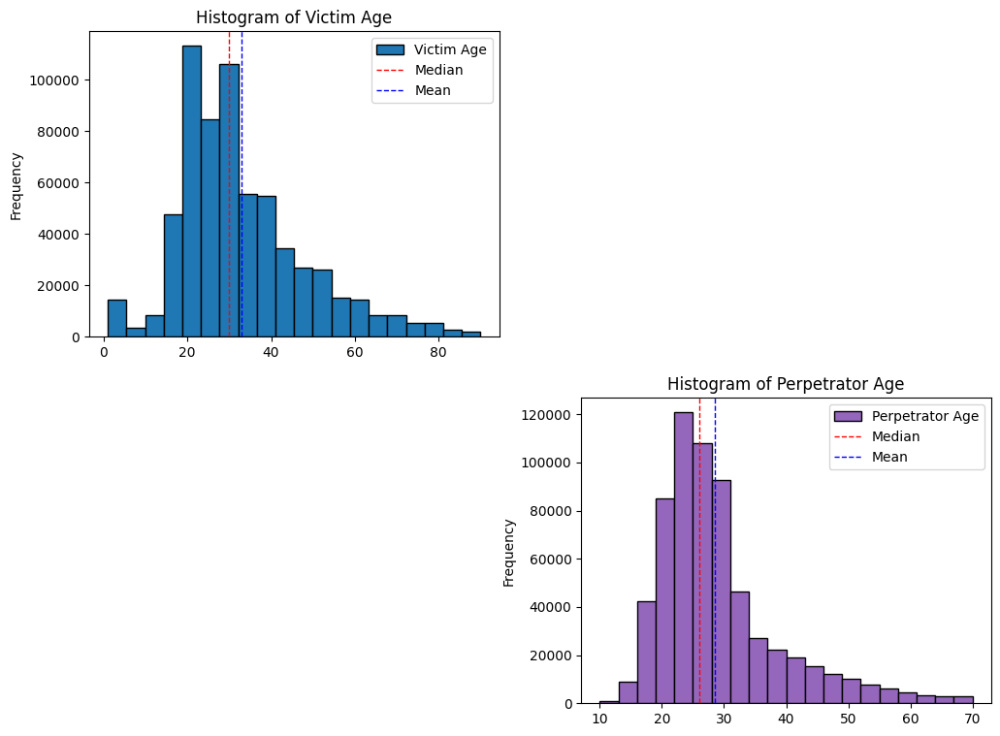

In [35]:
# plotting Victim Age and Perpetrator Age  on a standard scale

plt.figure(figsize=[12, 9])

# the Victim Age column
plt.subplot(2, 2, 1)
plot_histogram_with_stats(df, 'Victim Age')

# the Perpetrator Age column
plt.subplot(2, 2, 4)
plot_histogram_with_stats(df, 'Perpetrator Age', color = color4)

In [36]:

def plot_count_plot(df, column_name, color = 'tab:blue'):
    """
    Plots a countplot for the specified column in the DataFrame.

    Parameters:
    df (pd.DataFrame): The DataFrame containing the data.
    column_name (str): The name of the column to plot.
    """
    # Get the order of the column
    order = df[column_name].value_counts().index
    
    # Plot the countplot
    sns.countplot(data = df, y = column_name, edgecolor='black', color = color, order = order);
    plt.title(f'Countplot of {column_name}');
    
    
    # Add a legend
    plt.legend();

In [106]:
name_larges = df['Agency Name'].value_counts().nlargest(40)
name_larges = name_larges.reset_index(drop = False)
name_larges

,Agency Name,count
0,New York,38416
1,Los Angeles,29007
2,Chicago,21331
3,Detroit,17206
4,Houston,13046
5,Philadelphia,12861
6,Dallas,9611
7,Baltimore,9331
8,New Orleans,7846
9,Washington,7828


In [109]:
name_larges_df = df[df['Agency Name'].isin(name_larges['Agency Name'])]


C:\Users\HITECH\AppData\Local\Temp\ipykernel_20980\3735945998.py:18: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend();


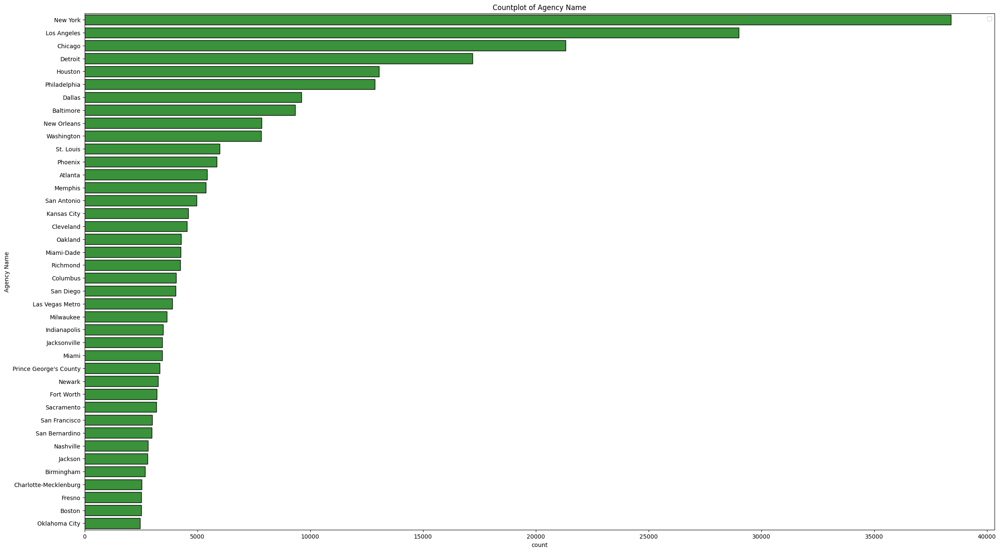

In [108]:
# plotting 'Agency Name' 

plt.figure(figsize=[28, 16])


# the Agency Name column
plot_count_plot(name_larges_df, 'Agency Name', color = color2)



In [40]:
city_largest = df['City'].value_counts().nlargest(40)
city_largest = city_largest.reset_index(drop = False)
city_largest

,City,count
0,Los Angeles,44511
1,New York,38431
2,Cook,22383
3,Wayne,19904
4,Harris,16331
5,Philadelphia,12851
6,Dallas,11377
7,Jefferson,9573
8,Baltimore city,9336
9,Dade,9077


In [41]:
df['State'].value_counts()

State
California              99783
Texas                   62095
New York                49268
Florida                 37164
Michigan                28448
Illinois                25871
Pennsylvania            24236
Georgia                 21088
North Carolina          20390
Louisiana               19629
Ohio                    19158
Maryland                17312
Virginia                15520
Tennessee               14930
Missouri                14832
New Jersey              14132
Arizona                 12871
South Carolina          11698
Indiana                 11463
Alabama                 11376
Oklahoma                 8809
Washington               7815
District of Columbia     7115
Arkansas                 6947
Colorado                 6593
Kentucky                 6554
Mississippi              6546
Wisconsin                6191
Massachusetts            6036
Nevada                   5553
Connecticut              4896
New Mexico               4272
Oregon                   4217
Minn

C:\Users\HITECH\AppData\Local\Temp\ipykernel_20980\3735945998.py:18: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend();


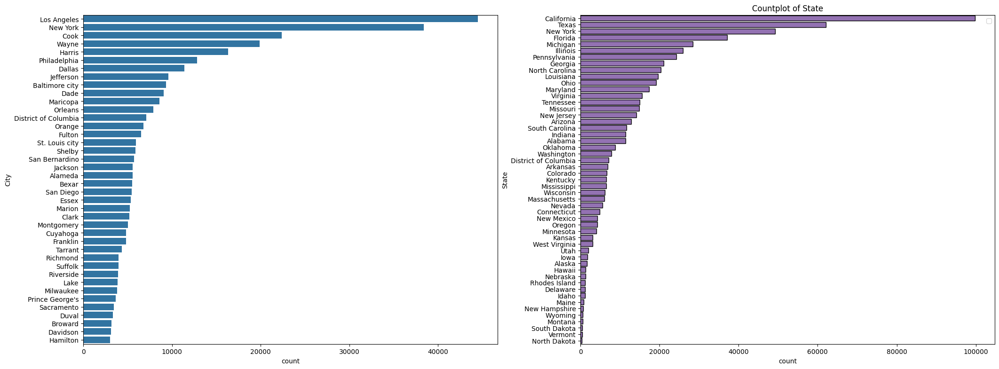

In [42]:
# plotting the 'City' and 'State' columns 
plt.figure(figsize=[25, 20])

# the Agency Code column
plt.subplot(2, 2, 1)
sns.barplot(data = city_largest, y = 'City',x = 'count', color = 'tab:blue');

# the Agency Name column
plt.subplot(2, 2, 2)
plot_count_plot(df, 'State', color = color4);


**Observations**
* Los Angeles and New York: These cities have the highest number of homicides, reflecting their large populations and urban density.
* California: This state has the highest number of homicides, possibly due to its large population and numerous major cities.
* Texas and New York: Both states follow California closely, reflecting significant urban populations and associated crime rates.
* Lower Homicide States: States like North Dakota and Vermont have significantly lower homicide counts, indicative of their smaller populations and rural settings.

Further investigations could be done, by adding the population estimates for each state and then calculating the proportions for each state and comparing them.

In [43]:
# Using the barplot to plot the proportions of the months in the Month column
months = df['Month'].value_counts(normalize=True) * 100
months = months.reset_index(drop = False)
months

,Month,proportion
0,July,9.193458
1,August,9.095722
2,December,8.643849
3,September,8.476257
4,June,8.404991
5,October,8.403111
6,May,8.363014
7,January,8.290026
8,March,8.057589
9,April,8.020781


<Axes: xlabel='proportion', ylabel='Month'>

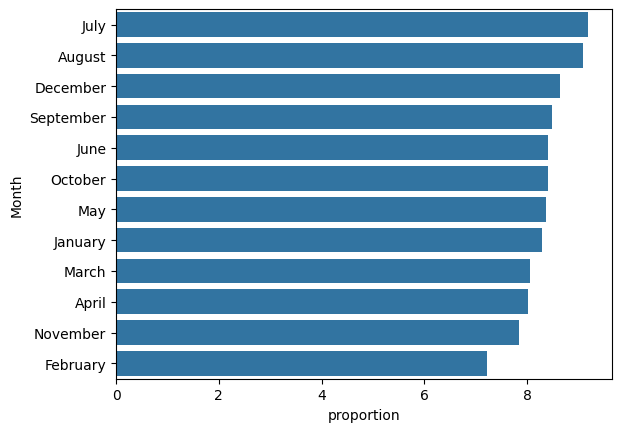

In [44]:
sns.barplot(data = months, y = 'Month', x = 'proportion', color = 'tab:blue')

Apparentrly July and August are the worst months for holdays, but overall the proportions are close.

In [111]:
# Converting 'Crime Solved' to categorical type
df['Crime Solved'] = df['Crime Solved'].astype("category")

C:\Users\HITECH\AppData\Local\Temp\ipykernel_20980\3735945998.py:18: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend();


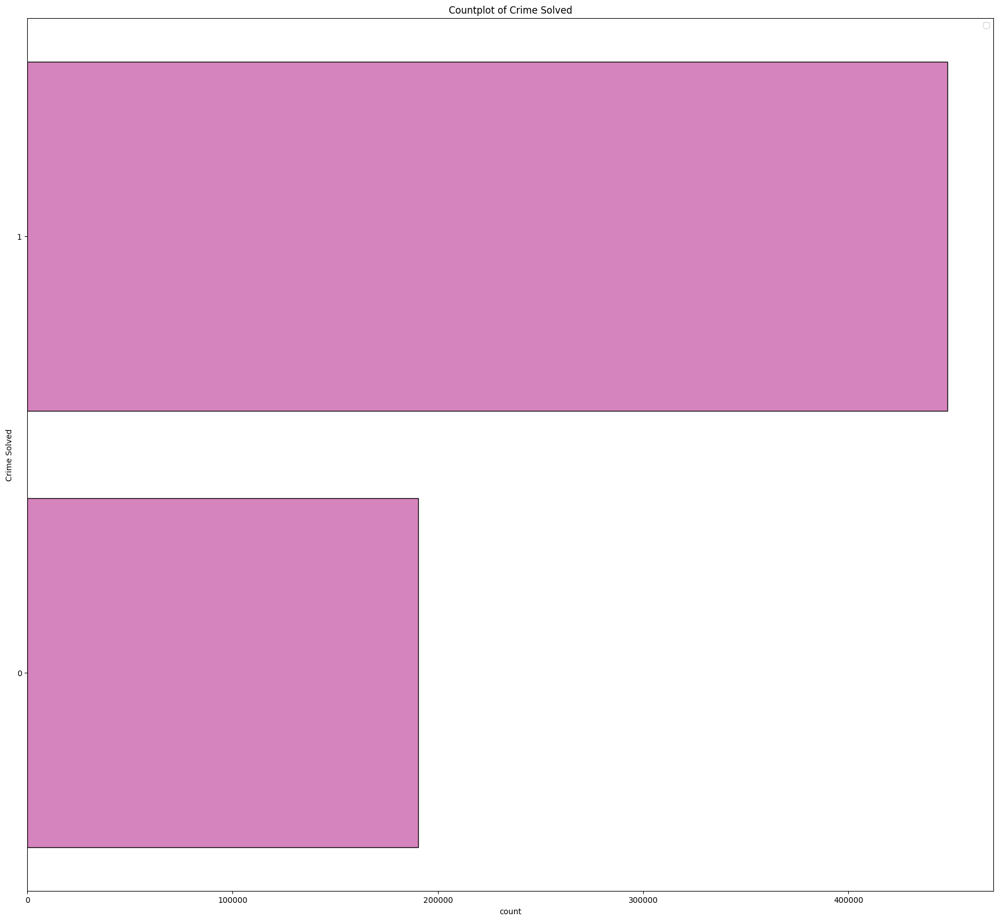

In [112]:
# plotting 'Crime Type', and 'Crime Solved' columns

plt.figure(figsize=[22, 20])
plot_count_plot(df, 'Crime Solved', color = color6);



Homicide is the killing of another human being. Murder is an unlawful homicide with malice aforethought. Therefore, homicide is an umbrella term that includes more situations where someone gets killed, such as lawful killings or those without malice aforethought, also known as manslaughter.

As we can see from the plot above almost all of the data in the dataframe is a murder or manslaughter. But unfortunately, the number of crimes that haven't been solved is huge and concerning.

In [47]:
df['Victim Age'].value_counts()

Victim Age
32    35323
22    23049
20    23031
25    22939
21    22796
      ...  
86      574
87      460
88      408
89      313
90      281
Name: count, Length: 90, dtype: int64

C:\Users\HITECH\AppData\Local\Temp\ipykernel_20980\3735945998.py:18: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend();
C:\Users\HITECH\AppData\Local\Temp\ipykernel_20980\3735945998.py:18: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend();
C:\Users\HITECH\AppData\Local\Temp\ipykernel_20980\3735945998.py:18: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend();
C:\Users\HITECH\AppData\Local\Temp\ipykernel_20980\3735945998.py:18: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argume

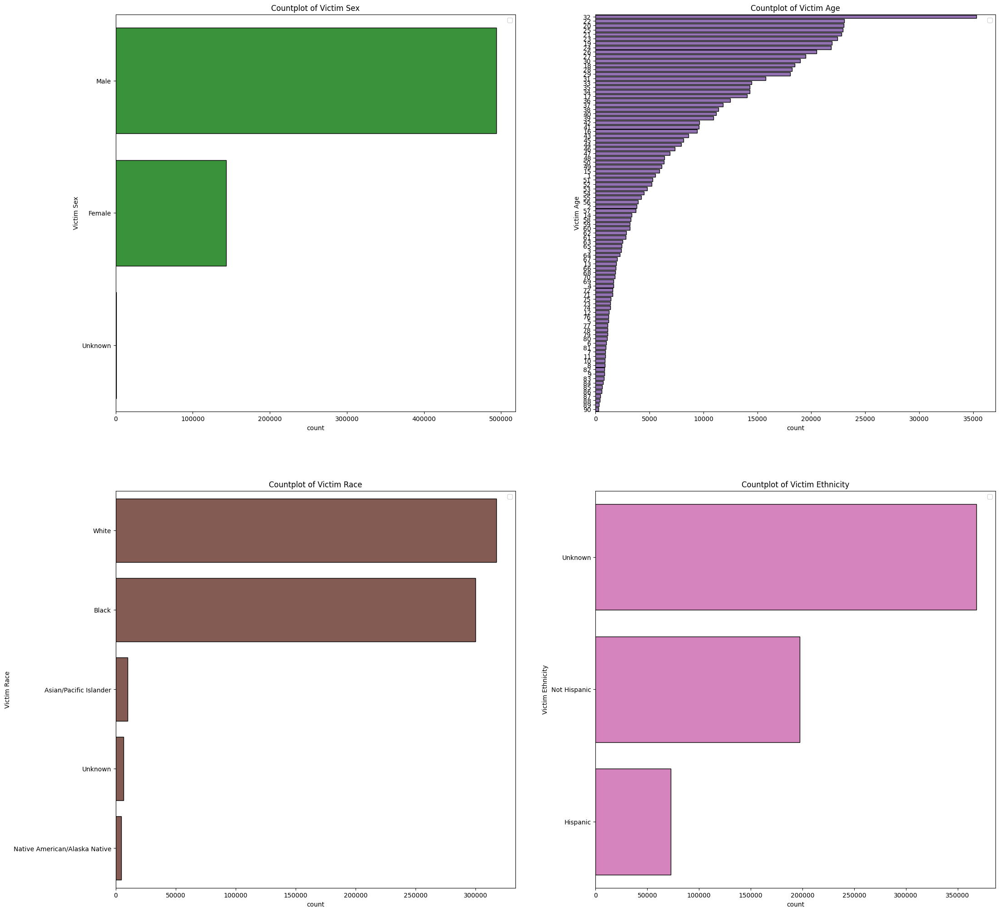

In [48]:
# plotting 'Victim Sex', 'Victim Age', 'Victim Race', and 'Victim Ethnicity' columns 

plt.figure(figsize=[25, 25])

plt.subplot(2, 2, 1)
plot_count_plot(df, 'Victim Sex', color = color2);



plt.subplot(2, 2, 2)
plot_count_plot(df, 'Victim Age', color = color4);


plt.subplot(2, 2, 3)
plot_count_plot(df, 'Victim Race', color = color5);


plt.subplot(2, 2, 4)
plot_count_plot(df, 'Victim Ethnicity', color = color6);



**Observations**
The Victim Age histogram plot suggests : 
* The age group with the highest frequency of victims falls between the early 20s and early 30s, with notable peaks at ages 32, 22, 20, 25, and 21, this implies that individuals in their 20s and early 30s are disproportionately represented among homicide victims, indicating that this age group is particularly vulnerable


* As the victim age increases beyond the early 30s, there is a noticeable decline in the number of victims, and the decline continues progressively as the age increases, which is expected as the population size tends to decrease in older age groups, and the risk of being involved in violent crimes may also diminish.


* The number of victims sharply decreases in the highest age ranges (e.g., 88, 89, 90 years), these extreme ages show a minimal number of victims, indicating that elderly individuals are less likely to be victims of homicide, possibly due to their smaller population size and lower likelihood of being involved in situations leading to violent crime.



The histogram reveals a clear pattern where younger adults, particularly those in their 20s and 30s, are the most frequent victims of homicide, while older age groups see a gradual decline in victimization.


C:\Users\HITECH\AppData\Local\Temp\ipykernel_20980\3735945998.py:18: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend();
C:\Users\HITECH\AppData\Local\Temp\ipykernel_20980\3735945998.py:18: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend();
C:\Users\HITECH\AppData\Local\Temp\ipykernel_20980\3735945998.py:18: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend();
C:\Users\HITECH\AppData\Local\Temp\ipykernel_20980\3735945998.py:18: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argume

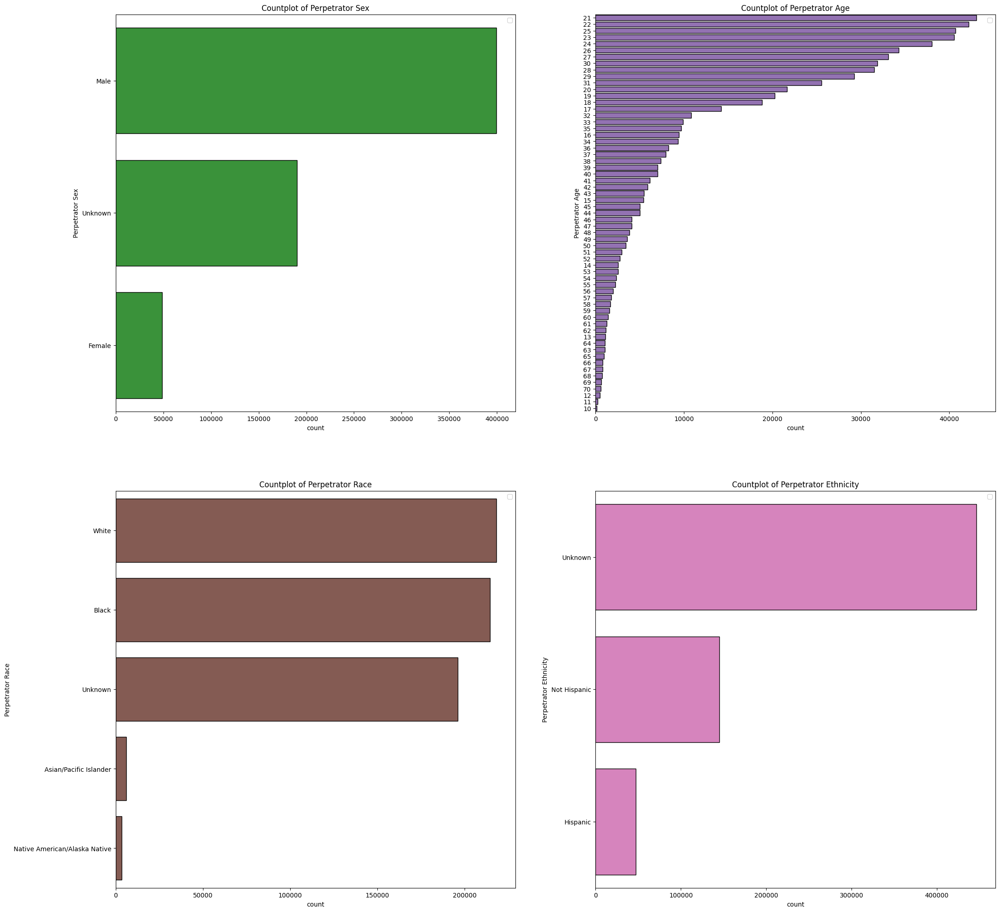

In [49]:
# plotting 'Perpetrator Sex', 'Perpetrator Age', 'Perpetrator Race', and 'Perpetrator Ethnicity' columns
plt.figure(figsize=[25, 25])

plt.subplot(2, 2, 1)
plot_count_plot(df, 'Perpetrator Sex', color = color2);


plt.subplot(2, 2, 2)
plot_count_plot(df, 'Perpetrator Age', color = color4);

plt.subplot(2, 2, 3)
plot_count_plot(df, 'Perpetrator Race', color = color5);

plt.subplot(2, 2, 4)
plot_count_plot(df, 'Perpetrator Ethnicity', color = color6);


**Observations**

1. Perpetrator Sex Distribution (Top Left Plot)
- Male Dominance: The majority of perpetrators are male, accounting for a significant portion of the data.
- But female perpetrators are significantly fewer in comparison to males.

2. Perpetrator Age Distribution (Top Right Plot)
   
    The countplot provides a more detailed view of the frequency distribution of perpetrator ages.
- Most Frequent Ages: The most common ages for perpetrators are between 20 and 30, with age 21 being the most frequent.
- Frequency Drops: After age 30, the frequency of perpetrators sharply decreases. This trend continues with age, with significantly fewer perpetrators in older age groups.
- Less Common Ages: Ages below 16 and above 50 are the least common for perpetrators, with very few individuals in these age ranges.

1. Perpetrator Race Distribution (Bottom Left Plot)
- Major Races Involved: The data shows a relatively even distribution between White and Black perpetrators.



C:\Users\HITECH\AppData\Local\Temp\ipykernel_20980\3735945998.py:18: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend();
C:\Users\HITECH\AppData\Local\Temp\ipykernel_20980\3735945998.py:18: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend();


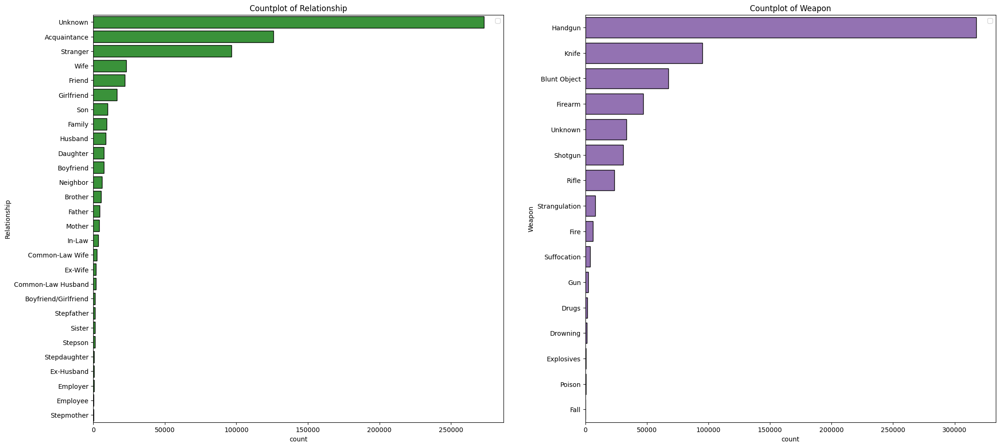

In [50]:
# plotting 'Relationship', and 'Weapon' columns
plt.figure(figsize=[25, 25])

plt.subplot(2, 2, 1)
plot_count_plot(df, 'Relationship', color = color2);



plt.subplot(2, 2, 2)
plot_count_plot(df, 'Weapon', color = color4);


**Observations**

* Looking at the weapon plot the most used weapon is a handgun.
* Most types of relationships between the victim and the perpetrator are "Acquaintance" and then "Stranger" that's why investigators typically start with people who know the victim.


### Discuss the distribution(s) of your variable(s) of interest. Were there any unusual points? Did you need to perform any transformations?

**Victim Age**:

* *Distribution*: The distribution of victim ages was right-skewed, with the majority of victims falling within the younger age groups (specifically between 15 to 35 years old). The histogram showed a clear peak in this range, with fewer victims in older age brackets.
* *Unusual Points*: There were some outliers in the Victim Age data, particularly at the upper end of the age spectrum. These outliers were identified and removed during the data cleaning process to ensure a more accurate representation of the distribution.

**Perpetrator Age**:

* *Distribution*: The Perpetrator Age distribution was similarly right-skewed, with a concentration of ages around the early 20s. The distribution was fairly normal around the peak but tailed off as age increased.
* *Unusual Points*: There were no significant outliers observed in the Perpetrator Age data that required removal. However, missing values were identified.

### Of the features you investigated, were there any unusual distributions? Did you perform any operations on the data to tidy, adjust, or change the form of the data? If so, why did you do this?

**Unusual Distributions**:

* The Victim Age distribution was notably skewed, with some extreme values (outliers) that did not align with the general pattern of the data. These outliers could potentially distort the results and provide a misleading understanding of the typical victim profile.
* The Perpetrator Age distribution was similarly right-skewed, with a large number of points at 0, which indicated that there were miising values (unknown age as zero).
**Data Operations**:

* *Outlier Removal (Victim Age)*: To address the unusual distribution in Victim Age, outliers were removed. This operation was necessary to prevent these extreme values from disproportionately influencing the results of the analysis.
* *Imputation (Victim Age and Perpetrator Age)*: Both the Victim Age and Perpetrator Age columns had missing values. Imputation was performed to fill in these gaps. This was crucial to ensure that the analysis was comprehensive and not biased by the presence of missing data. By imputing the missing values, the integrity and completeness of the dataset were preserved, allowing for more accurate and reliable conclusions.

## Bivariate Exploration

To start off with, I want to look at the pairwise correlations present between features in the data.

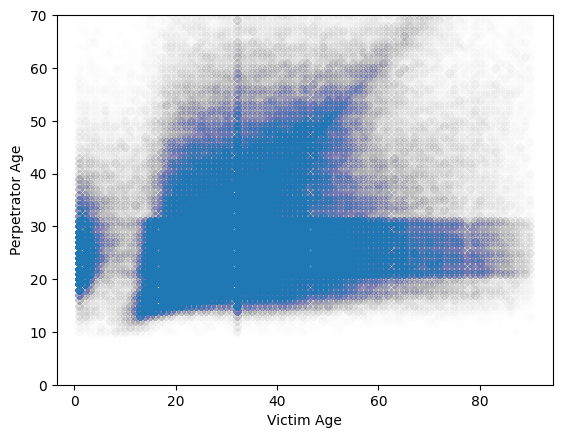

In [ ]:
sns.scatterplot(data = df, y = 'Perpetrator Age', x = 'Victim Age', alpha = 0.00199)
plt.ylim(0, 70);

**Observations from the Scatter Plot of Victim Age vs. Perpetrator Age**
* **Cluster of Very Young Victims**: There is a distinct cluster where victims are very young (from less than a year old up to around 5 years old). In these cases, the perpetrators are typically aged between 18 and 35, suggesting a trend of younger adults being involved in crimes against very young victims.

* **Positive Correlation in Mid-Aged Victims**: A noticeable pattern emerges for victims aged between 15 to 50 years, where there seems to be a positive linear correlation between the ages of the victims and the perpetrators. This indicates that as the age of the victim increases within this range, the age of the perpetrator also tends to increase, often within a similar range.

* **Older Victims and Younger Perpetrators**: For victims aged 55 to 80 years, the perpetrators are generally younger, falling within the age range of 20 to 30. This suggests a trend where older victims are more often targeted by younger perpetrators.

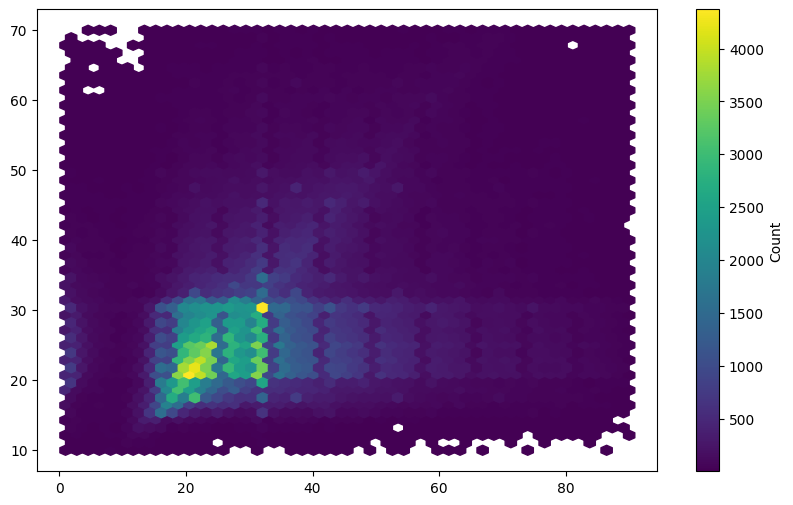

In [ ]:
# Create a hexbin plot
plt.figure(figsize=(10, 6))
hb = plt.hexbin(df['Victim Age'], df['Perpetrator Age'], gridsize=50, cmap='viridis', mincnt=1)
plt.colorbar(hb, label='Count')



In [ ]:
df.isnull().sum()

Record ID                0
Agency Code              0
Agency Name              0
Agency Type              0
City                     0
State                    0
Year                     0
Month                    0
Incident                 0
Crime Type               0
Crime Solved             0
Victim Sex               0
Victim Age               0
Victim Race              0
Victim Ethnicity         0
Perpetrator Sex          0
Perpetrator Age          0
Perpetrator Race         0
Perpetrator Ethnicity    0
Relationship             0
Weapon                   0
Victim Count             0
Perpetrator Count        0
Record Source            0
dtype: int64

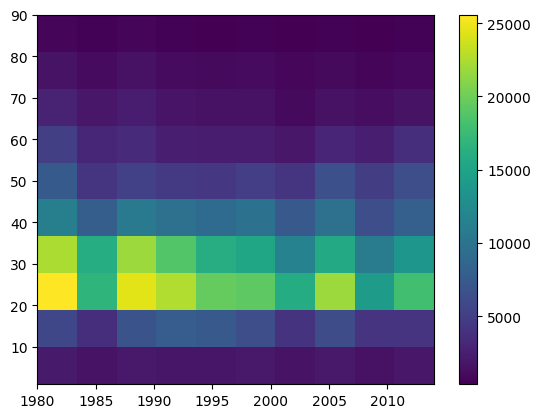

In [ ]:
# Plot hist2d of year and victim age columns
plt.hist2d(data=df, x='Year', y='Victim Age');
plt.colorbar()


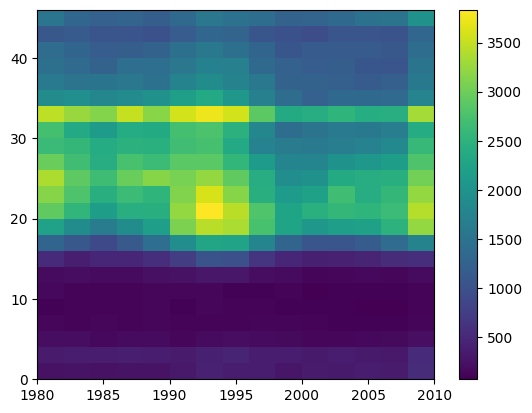

In [ ]:
# Specify the bins for x axis and y axis for better understanding the trends of the victim age range being from 0 to 45
bins_x = np.arange(1980, 2010+2, 2)
bins_y = np.arange(0, 45+2, 2)
plt.hist2d(data=df, x='Year', y='Victim Age', bins=[bins_x, bins_y]);
plt.colorbar();

**Observations from the 2D Histogram of Year vs. Victim Age**

* **Cluster in the Early 90s**: A significant concentration of cases is observed between the years 1991 and 1995, particularly among victims aged 18 to 25.This indicates a higher frequency of younger victims during this period.
* **Consistent Age Band in Early Years**: From 1980 to 1992, there is a noticeable horizontal band indicating that the most common victim age was consistently around 31 to 32 years. This suggests a stable pattern in victim age during these years. However, after 1992, the frequency associated with this age group diminishes but persists until 2009, indicating a shift in the distribution of victim ages over time.
* **Patterns in 2010**: In 2010, there’s a resurgence in the number of victims aged 19 to 28. Additionally, the age band of 31-32 reappears, indicating a potential return to earlier trends. The dual presence of these age ranges suggests a broader spread among victims in that year.

<Axes: xlabel='Year', ylabel='Victim Age'>

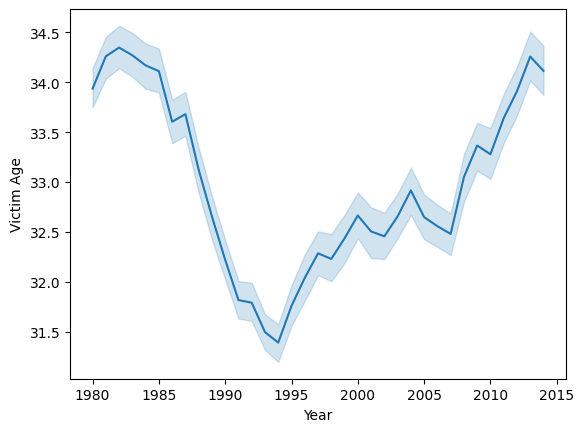

In [ ]:
sns.lineplot(data = df, x = 'Year', y = 'Victim Age')

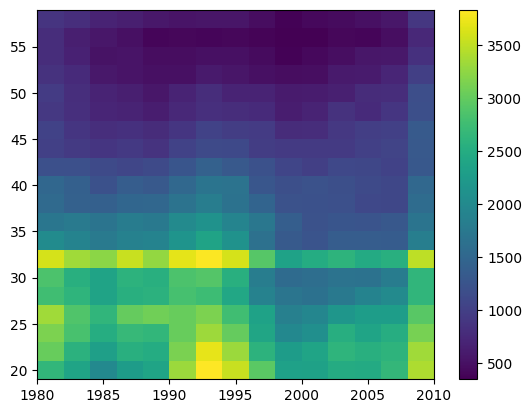

In [ ]:
bins_x = np.arange(1980, 2010+2, 2)
bins_y = np.arange(19, 58+2, 2)
plt.hist2d(data=df, x='Year', y='Victim Age', bins=[bins_x, bins_y]);
plt.colorbar()

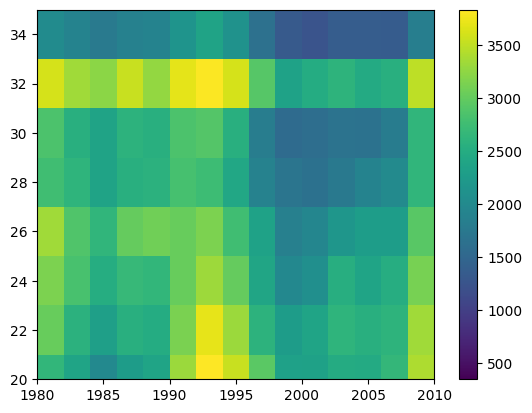

In [ ]:
bins_x = np.arange(1980, 2010+2, 2)
bins_y = np.arange(19, 58+2, 2)
plt.hist2d(data=df, x='Year', y='Victim Age', bins=[bins_x, bins_y]);
plt.colorbar()
plt.ylim(20, 35);

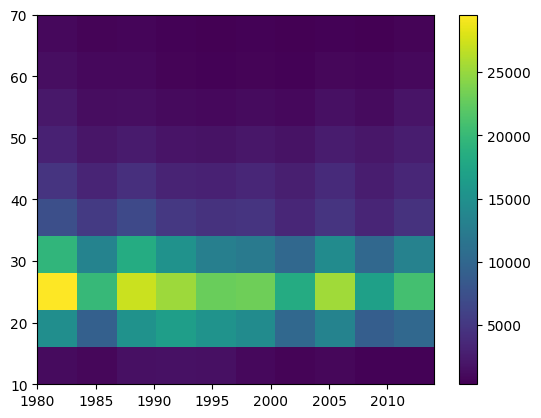

In [ ]:
# Now let's see the patterns of the perpetrator age column over the years
plt.hist2d(data=df, x='Year', y='Perpetrator Age');
plt.colorbar()

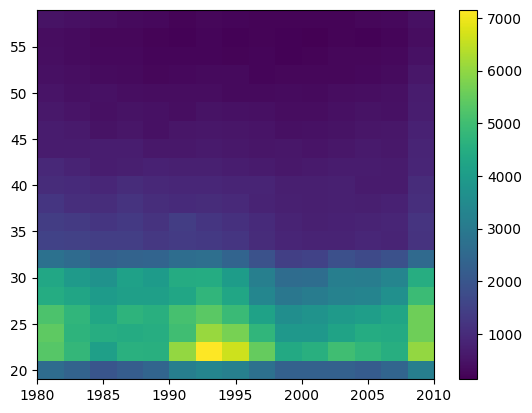

In [ ]:
# let's set the bins for x axis and y axis to catch possible trends
bins_x = np.arange(1980, 2010+2, 2)
bins_y = np.arange(19, 58+2, 2)
plt.hist2d(data=df, x='Year', y='Perpetrator Age', bins=[bins_x, bins_y]);
plt.colorbar()

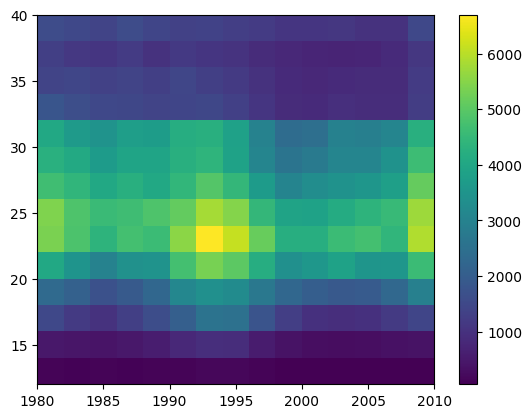

In [ ]:
# let's set the bins for x axis and y axis to catch possible trends
bins_x = np.arange(1980, 2010+2, 2)
bins_y = np.arange(12, 40+2, 2)
plt.hist2d(data=df, x='Year', y='Perpetrator Age', bins=[bins_x, bins_y]);
plt.colorbar()

**Observations from the 2D Histogram of Year vs. Perpetrator Age**

* **General Trend in Perpetrator Age**: The plot reveals that in general the most common range of perpetrator ages over the years falls between 20 and 32. This indicates that individuals in this age range have been consistently involved in homicides over the observed period.

* **Prominent Cluster (1990-1996)**: There is a noticeable concentration of cases between the years 1990 and 1996, where the perpetrators' ages predominantly range from 20 to 26. This suggests an increased frequency of homicides involving younger perpetrators during this timeframe.

* **Smaller Clusters**: Two smaller clusters are visible:

    * The first cluster appears between 1980 and 1983, with perpetrators aged between 23 and 26.
    * The second cluster is observed from 2008 to 2010, where the age range of perpetrators extends slightly from 23 to 28. This might indicate a resurgence of younger perpetrators in more recent years.

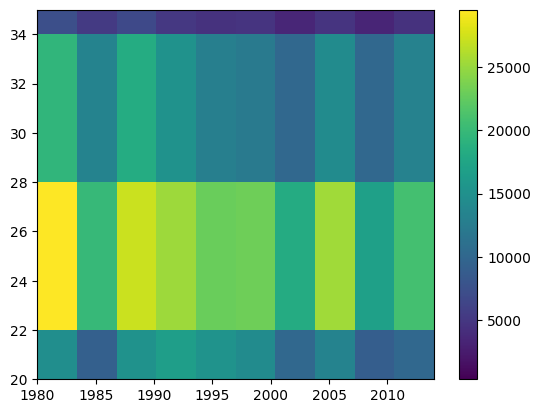

In [ ]:
plt.hist2d(data=df, x='Year', y='Perpetrator Age');
plt.colorbar()
plt.ylim(20, 35);

**Observations from the 2D Histogram with ylim Set (Perpetrator Ages 22 to 34)**

* **High Frequency in Early 1980s**: The histogram shows a strong concentration of perpetrator ages between 22 and 28 during the years 1980 to 1984. This suggests that this age group was highly active in incidents during this period.

* **Significant Drop (1984-1986)**: There is a noticeable decline in the frequency of perpetrators within the same age range from 1984 to 1986. This drop might indicate a temporary reduction in incidents involving this age group during these years.

* **Resurgence (1987-1993)**: A resurgence in activity is evident between 1987 and 1993, where the frequency of perpetrators aged 22 to 28 increased again. This could suggest a renewed involvement of younger adults in incidents during this period.

* **Fluctuations in the Early 2000s**: Following the resurgence, there's a small decline from 1993 to the early 2000s, and another drop from 2001 to 2004. However, this is followed by another increase in frequency from 2004 to 2007, indicating fluctuating levels of activity among this age group over time.

In [ ]:
# Group by year and month and taking the mean of the perpetrator and victim ages columns
age_by_month = df.groupby(['Year', 'Month'])[['Perpetrator Age', 'Victim Age']].mean().reset_index()

In [ ]:

age_by_month

,Year,Month,Perpetrator Age,Victim Age
0,1980,April,29.639205,33.871023
1,1980,August,29.202024,33.619992
2,1980,December,28.627481,34.092112
3,1980,February,29.188439,34.296532
4,1980,January,28.948493,33.391233
...,...,...,...,...
415,2014,March,30.447133,34.396057
416,2014,May,30.440000,34.371538
417,2014,November,30.088285,33.975382
418,2014,October,29.430040,33.642688


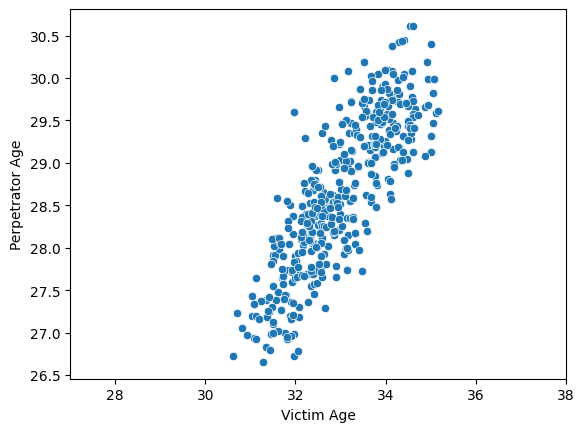

In [ ]:
sns.scatterplot(data = age_by_month, y = 'Perpetrator Age', x = 'Victim Age');
plt.xlim(27, 38);


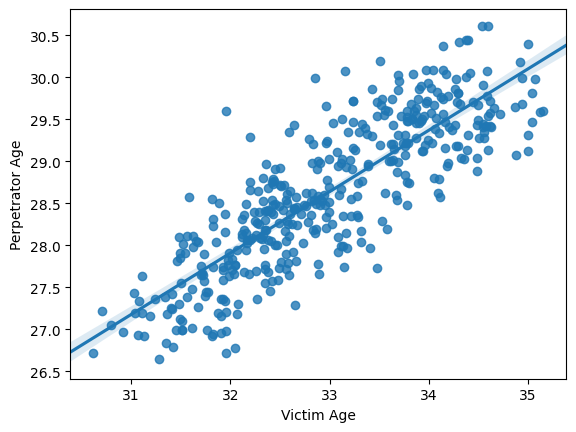

In [ ]:
sns.regplot(data=age_by_month, x='Victim Age', y='Perpetrator Age', truncate=False);


**Observations from the Regression Plot of Victim Age vs. Perpetrator Age**

* **Strong Positive Correlation**: There is a clear, strong positive correlation between victim age and perpetrator age. As the victim's age increases, the perpetrator's age also tends to increase. This relationship suggests that the ages of perpetrators and victims are closely related within the dataset.

In [ ]:
# Let's calculate the correlation 
cor_victim_perpetrator = age_by_month['Perpetrator Age'].corr(age_by_month['Victim Age'])
cor_victim_perpetrator

np.float64(0.8391295936444985)

In [52]:
# Let's Convert the column 'Crime Solved' from yes and no to 1 and 0.
# Make sure the column 'Crime Solved' has Consistency meaning no row has Crime Solved other than Yes or No
df[(df['Crime Solved'] != 'Yes') & (df['Crime Solved'] != 'No')]

,Unnamed: 0.1,Unnamed: 0,Agency Name,City,State,Year,Month,Crime Solved,Victim Sex,Victim Age,Victim Race,Victim Ethnicity,Perpetrator Sex,Perpetrator Age,Perpetrator Race,Perpetrator Ethnicity,Relationship,Weapon


In [53]:
# Converting the column to be 1 or 0 for calculations.
df['Crime Solved'] = df['Crime Solved'].map({'Yes' : 1, 'No' : 0})
df['Crime Solved']

0         1
1         1
2         0
3         1
4         0
         ..
638449    0
638450    1
638451    1
638452    1
638453    1
Name: Crime Solved, Length: 638454, dtype: int64

In [54]:
# Convert 'Crime Solved' column to integer
df['Crime Solved'] = df['Crime Solved'].astype(int)

In [55]:
# Insure the operation was successful
df.dtypes

Unnamed: 0.1              int64
Unnamed: 0                int64
Agency Name              object
City                     object
State                    object
Year                      int64
Month                    object
Crime Solved              int64
Victim Sex               object
Victim Age                int64
Victim Race              object
Victim Ethnicity         object
Perpetrator Sex          object
Perpetrator Age           int64
Perpetrator Race         object
Perpetrator Ethnicity    object
Relationship             object
Weapon                   object
dtype: object

(0.9, 1.2)

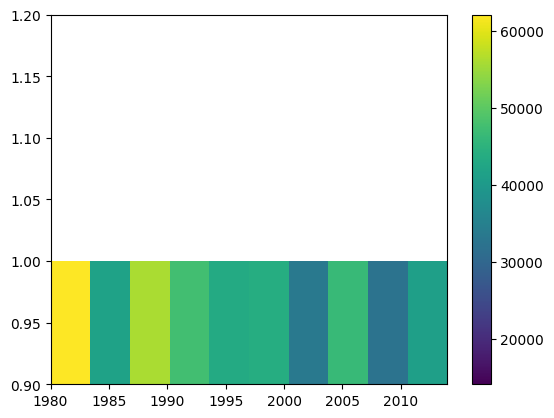

In [56]:
plt.hist2d(data=df, y='Crime Solved', x='Year', cmin = 0.5);
plt.colorbar()
plt.ylim(.9, 1.2)

(0.0, 0.4)

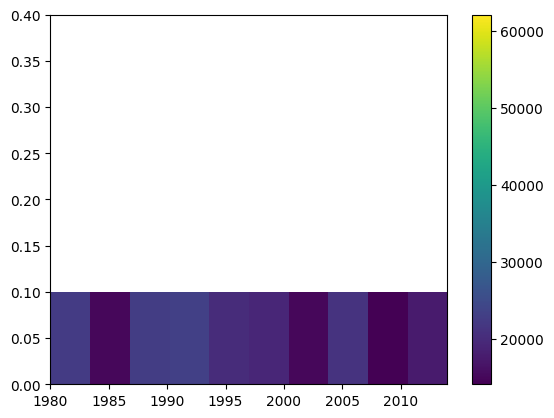

In [57]:
plt.hist2d(data=df, y='Crime Solved', x='Year', cmin = 0.5);
plt.colorbar()
plt.ylim(0, 0.4)

(0.0, 0.4)

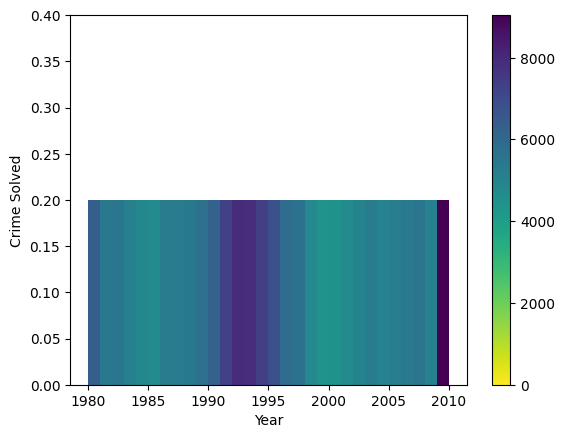

In [58]:
bins_x = np.arange(1980, 2010+1, 1)
bins_y = np.arange(0, 0.4,0.2)

sns.histplot(data=df, y='Crime Solved', x='Year', cmap='viridis_r', cbar=True, bins=[bins_x, bins_y]);
plt.ylim(0,0.4)


(0.5, 1.2)

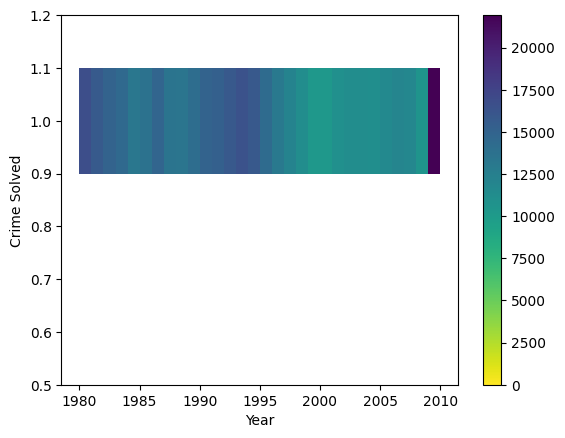

In [59]:
bins_x = np.arange(1980, 2010+1, 1)
bins_y = np.arange(0.9, 1.2,0.2)

sns.histplot(data=df, y='Crime Solved', x='Year', cmap='viridis_r', cbar=True, bins=[bins_x, bins_y]);
plt.ylim(0.5,1.2)

<Axes: xlabel='Year', ylabel='Crime Solved'>

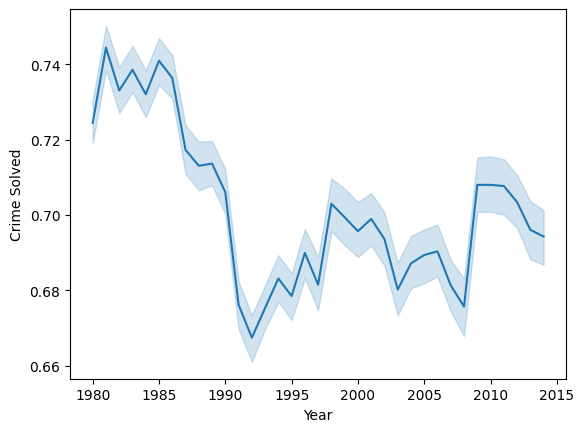

In [60]:
sns.lineplot(data = df, x = 'Year', y = 'Crime Solved')

**Overall Trend**:

The proportion of crimes solved shows a general decline from 1980 to the early 1990s. After 1995, the trend becomes more fluctuating, with several peaks and troughs observed.


The proportion of crimes solved was relatively high around 1980, with values above 0.74. However, there is a noticeable and steady decline throughout the 1980s and early 1990s, reaching a low point just below 0.68 around 1993. After the sharp decline in the early 1990s, the proportion of crimes solved begins to recover slightly around 1994.

In [61]:


def plot_violin_plot(df, column_name_y, column_name_x, color = 'tab:blue'):
    """
    Plots a Violin for the specified column in the DataFrame and adds horizontal lines for median and mean.

    Parameters:
    df (pd.DataFrame): The DataFrame containing the data.
    column_name_y (str): The name of the column that contains numeric data to plot.
    column_name_c (str): The name of the column that contains categorical data to plot.
    """
    
    # Plot the histogram
    sns.violinplot(data = df, y = column_name_y, x = column_name_x, inner='quartile');
    plt.title(f'Violin plot  of {column_name_x} vs {column_name_y}')

    
    # Add a legend
    plt.legend()
    

C:\Users\HITECH\AppData\Local\Temp\ipykernel_20980\1462270499.py:17: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


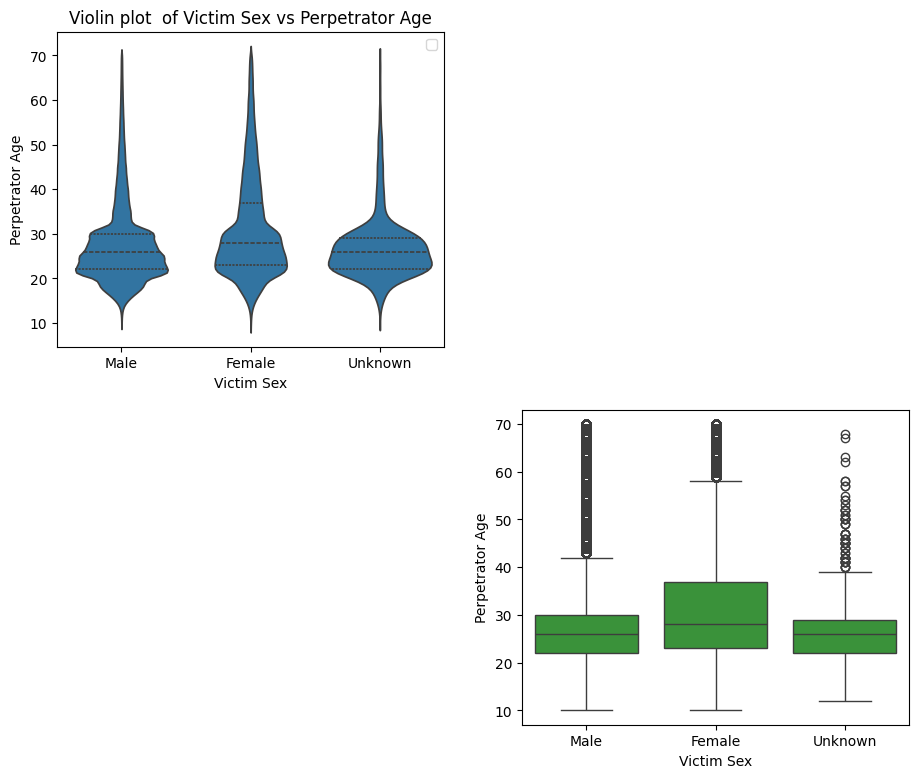

In [62]:

plt.figure(figsize = [11, 9])
plt.subplot(2, 2, 1)
plot_violin_plot(df, column_name_y = 'Perpetrator Age', column_name_x = 'Victim Sex')

plt.subplot(2, 2, 4)
sns.boxplot(data=df, y='Perpetrator Age', x='Victim Sex', color = color2);



**Observations**


Victim Sex vs. Perpetrator Age


**Violin Plot**


The overall distribution of Perpetrator Age across the Victim Sex categories (Male, Female, Unknown) is relatively consistent, as seen in the similar shapes of the violin plots. However, there are subtle differences in the age ranges where the frequency of perpetrators is higher for each victim sex category.

* *Male Victims*: The distribution shows a higher frequency of perpetrators within the age range of 18 to 32 years for male victims. This suggests that male victims are more likely to encounter perpetrators who are younger adults. The distribution narrows after 32, indicating a lower likelihood of male victims encountering older perpetrators.
* *Female Victims*: For female victims, the distribution appears more elongated, indicating a broader spread in the ages of perpetrators. While there is still a concentration in the 18 to 32 years range, similar to male victims, the plot suggests a higher likelihood of female victims encountering perpetrators who are older, extending into the late 30s and beyond. This indicates that females might be more at risk of victimization from a wider age range of perpetrators, especially older ones.
* *Unknown Victim Sex*: The distribution for the "Unknown" category is slightly different, with a more compact shape. This suggests that the age range of perpetrators is more concentrated around the median, with fewer extreme young or old perpetrators compared to the male and female victim categories.

C:\Users\HITECH\AppData\Local\Temp\ipykernel_20980\1462270499.py:17: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


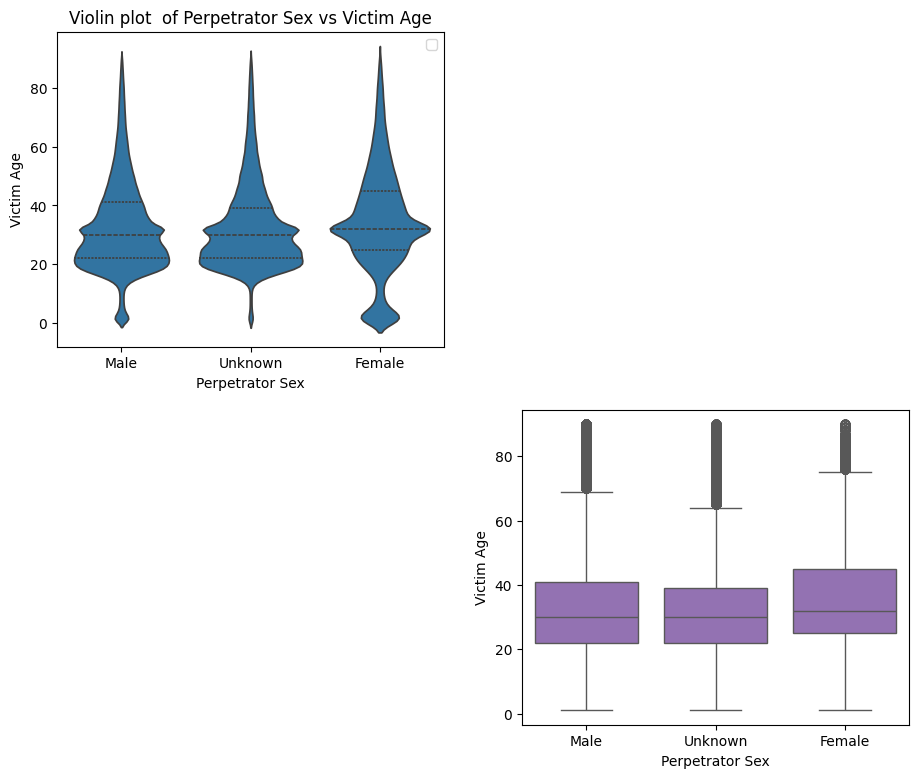

In [63]:

plt.figure(figsize = [11, 9])
plt.subplot(2, 2, 1)
plot_violin_plot(df, column_name_y = 'Victim Age', column_name_x = 'Perpetrator Sex')


plt.subplot(2, 2, 4)
sns.boxplot(data=df, y='Victim Age', x='Perpetrator Sex', color = color4);

C:\Users\HITECH\AppData\Local\Temp\ipykernel_20980\1462270499.py:17: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


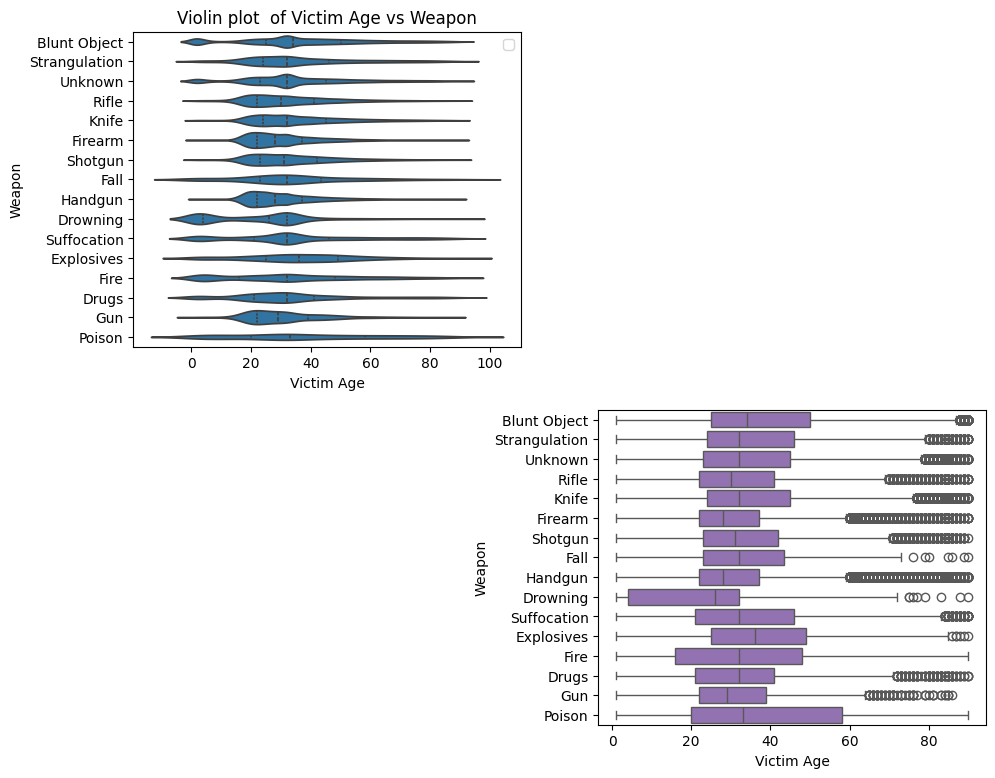

In [64]:

plt.figure(figsize = [11, 9])
plt.subplot(2, 2, 1)
plot_violin_plot(df, column_name_x = 'Victim Age', column_name_y = 'Weapon')


plt.subplot(2, 2, 4)
sns.boxplot(data=df, x='Victim Age', y='Weapon', color = color4);

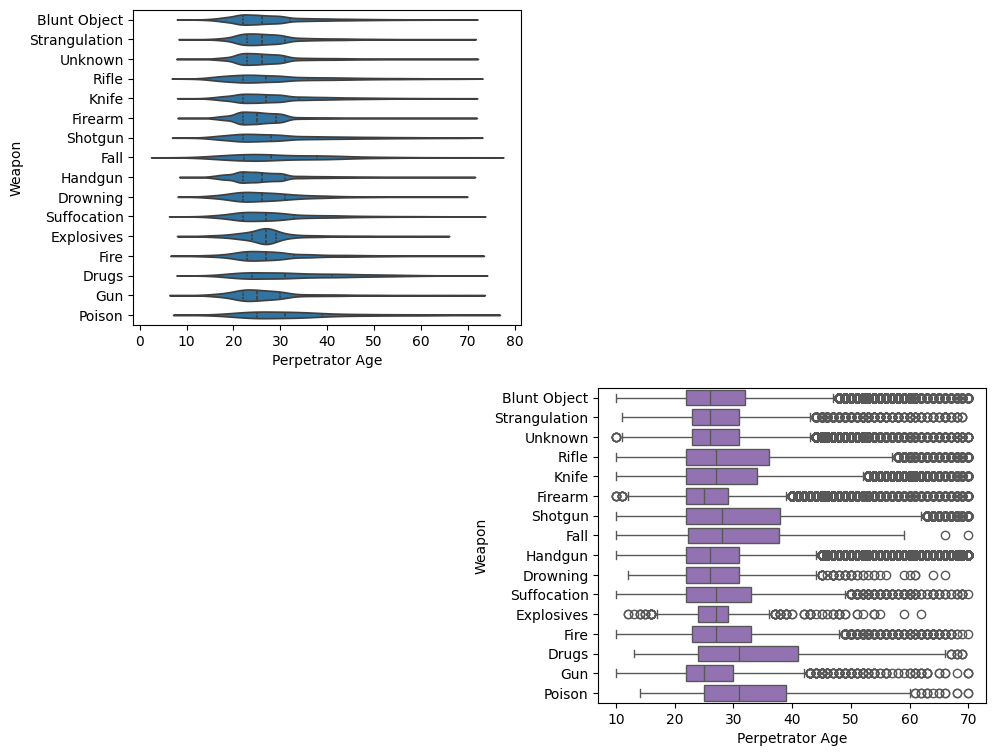

In [65]:

plt.figure(figsize = [11, 9])
plt.subplot(2, 2, 1)
sns.violinplot(data=df, x='Perpetrator Age', y='Weapon', inner='quartile');

plt.subplot(2, 2, 4)
sns.boxplot(data=df, x='Perpetrator Age', y='Weapon', color = color4);

In [66]:
df['Relationship'].value_counts()

Relationship
Unknown                 273013
Acquaintance            126018
Stranger                 96593
Wife                     23187
Friend                   21945
Girlfriend               16465
Son                       9904
Family                    9535
Husband                   8803
Daughter                  7539
Boyfriend                 7302
Neighbor                  6294
Brother                   5514
Father                    4361
Mother                    4248
In-Law                    3637
Common-Law Wife           2477
Ex-Wife                   1973
Common-Law Husband        1954
Boyfriend/Girlfriend      1383
Stepfather                1360
Sister                    1292
Stepson                   1170
Stepdaughter               754
Ex-Husband                 629
Employer                   509
Employee                   384
Stepmother                 211
Name: count, dtype: int64

In [67]:
# Divide the dataset into smaller datasets bassed on relationship type
relationships = df['Relationship'].value_counts()
n = len(relationships)

In [68]:
relationships1 = relationships[:int(n/4)]

In [69]:
relationships1 = relationships1.reset_index()

In [70]:
relationships1

,Relationship,count
0,Unknown,273013
1,Acquaintance,126018
2,Stranger,96593
3,Wife,23187
4,Friend,21945
5,Girlfriend,16465
6,Son,9904


In [71]:
relationships1_df = df[df['Relationship'].isin(relationships1['Relationship'])]

In [72]:
relationships1_df['Relationship'].value_counts()

Relationship
Unknown         273013
Acquaintance    126018
Stranger         96593
Wife             23187
Friend           21945
Girlfriend       16465
Son               9904
Name: count, dtype: int64

<Axes: xlabel='Weapon', ylabel='count'>

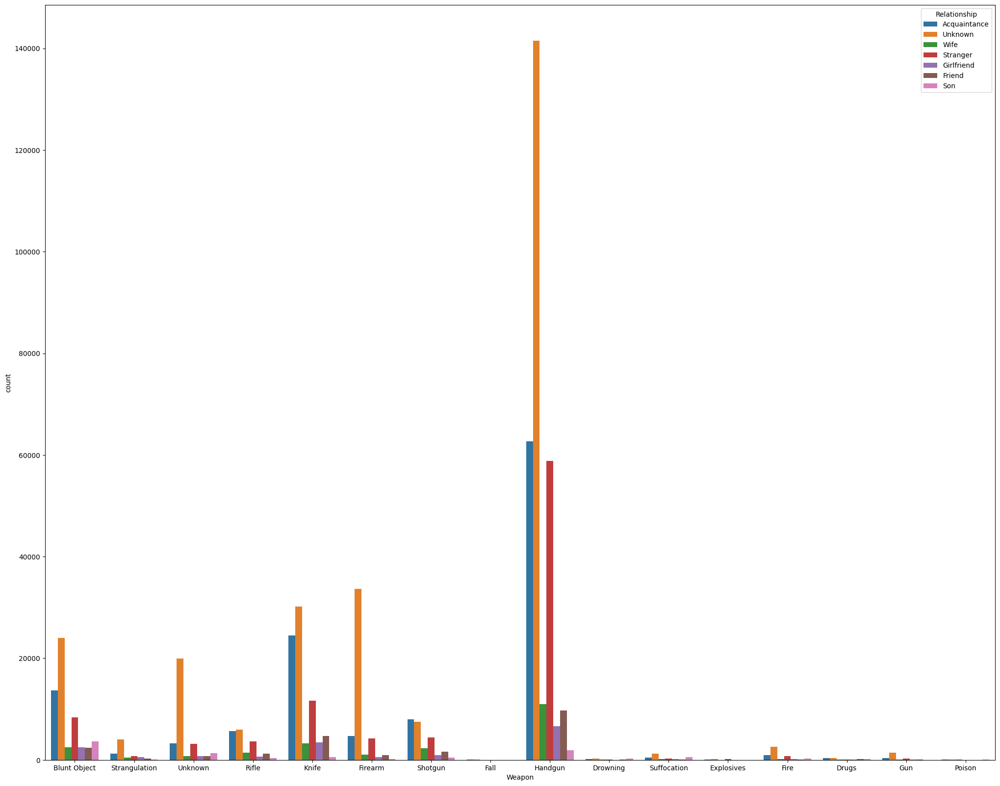

In [73]:
plt.figure(figsize = [25, 20])
sns.countplot(data = relationships1_df, x = 'Weapon', hue = 'Relationship')

**Observations**
* Stating with weapon type = Blunt Object
  relationship Acquaintance is the most frequent relationship.And same for Strangulation, Rifle, Firearm, Shotgun, and Handgon, the realtionships being Stranger is the second most frequent one.

In [74]:
relationships2 = relationships[int(n/4):int(n/2)]

In [75]:
relationships2 = relationships2.reset_index()

In [76]:
relationships2_df = df[df['Relationship'].isin(relationships2['Relationship'])]

In [77]:
# Since Stranger and Acquaintance were the most freaquent realtionships among all the dataset fruther invistigations for other relationships withouth these two were required
relationships2_df['Relationship'].value_counts()

Relationship
Family       9535
Husband      8803
Daughter     7539
Boyfriend    7302
Neighbor     6294
Brother      5514
Father       4361
Name: count, dtype: int64

<Axes: xlabel='Weapon', ylabel='count'>

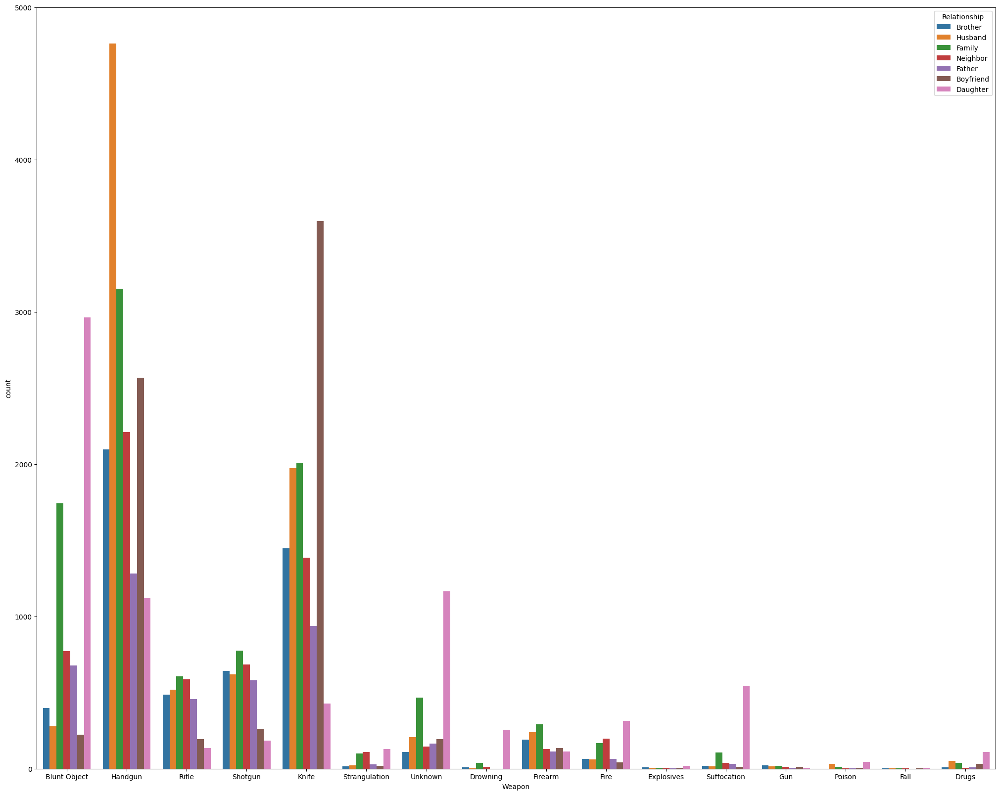

In [78]:
plt.figure(figsize = [25, 20])
sns.countplot(data = relationships2_df, x = 'Weapon', hue = 'Relationship')

**Observations on Weapon Type and Victim-Perpetrator Relationships**:
* Weapon Type: Blunt Object:

  * Most Frequent Relationship: The most common relationship observed in homicides involving a blunt object is Daughter. This suggests that blunt objects may be more frequently used in domestic settings, where familial relationships, particularly involving daughters, are predominant.
* Weapon Type: Handgun:

  * Most Frequent Relationship: In cases where a handgun is the weapon used, Husband emerges as the most frequent relationship. This indicates a significant number of handgun-related homicides occur within intimate partnerships, possibly reflecting situations of domestic violence.
* Weapon Type: Rifle:

  * Most Frequent Relationships: For homicides involving rifles, the relationships Family and Neighbor are the most commonly observed. This dual trend suggests that rifles may be used in both intra-family conflicts and disputes between neighbors, indicating the weapon's prevalence in both close-knit and community settings.
* Weapon Type: Shotgun:

  * Most Frequent Relationships: Similar to rifles, shotguns are most frequently associated with Family and Neighbor relationships. This further emphasizes the role of shotguns in domestic and neighborly disputes, possibly due to the weapon's accessibility and lethal potential in close-range confrontations.
* Weapon Type: Knife:

  * Most Frequent Relationship: Boyfriend is the most frequent relationship observed in knife-related homicides. This points to a significant occurrence of knife-related violence in intimate partner relationships, where proximity and emotional intensity may contribute to the choice of weapon.
* Weapon Types: Strangulation, Drowning, Fire, and Suffocation:

  * Most Frequent Relationship: In cases involving strangulation, drowning, fire, and suffocation, Daughter is the most common relationship. This suggests that these forms of homicide may often occur in highly personal and possibly premeditated contexts, where the victim is closely related to the perpetrator, particularly within the family.

In [79]:
relationships3 = relationships[int(n/2):21]
relationships3

Relationship
Mother                  4248
In-Law                  3637
Common-Law Wife         2477
Ex-Wife                 1973
Common-Law Husband      1954
Boyfriend/Girlfriend    1383
Stepfather              1360
Name: count, dtype: int64

In [80]:
relationships3 = relationships3.reset_index()


In [81]:
relationships3_df = df[df['Relationship'].isin(relationships3['Relationship'])]

<Axes: xlabel='Weapon', ylabel='count'>

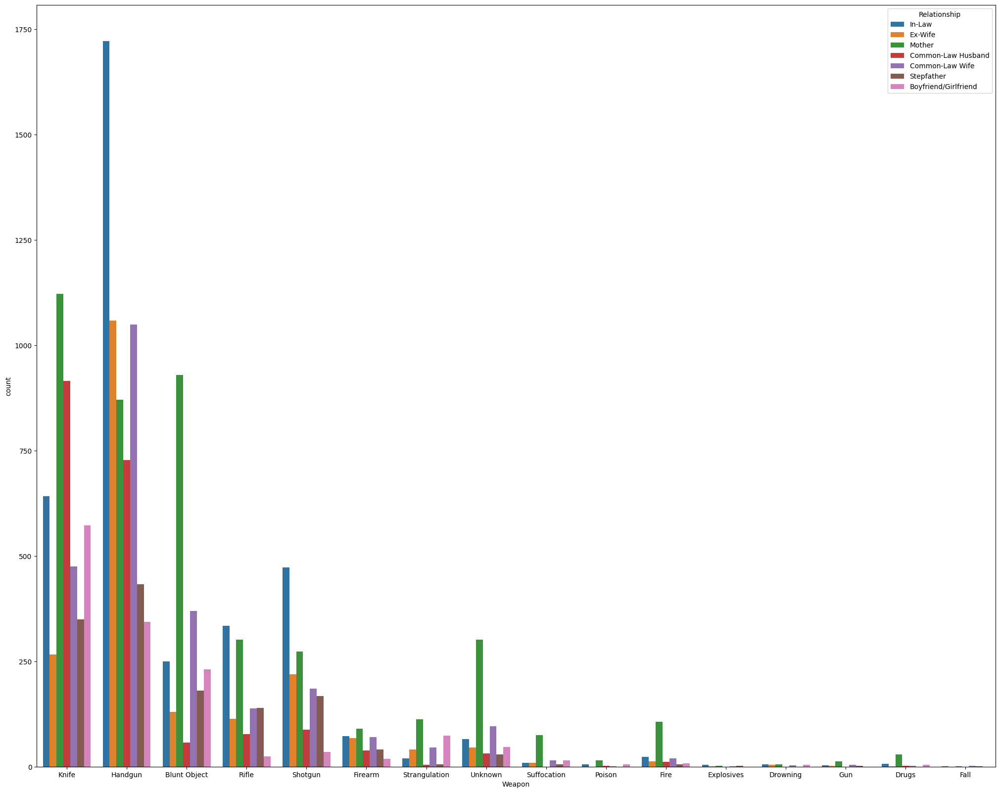

In [82]:
plt.figure(figsize = [25, 20])
sns.countplot(data = relationships3_df, x = 'Weapon', hue = 'Relationship')

for knife mother was the most frequent
for handgun it was in-law
for blunt object it was mother
for rifle it was mother and in-law
for shotgun it was in-law
for firearm. strangulation, suffocation and fire it was mother

In [83]:
relationships4 = relationships[21:]
relationships4

Relationship
Sister          1292
Stepson         1170
Stepdaughter     754
Ex-Husband       629
Employer         509
Employee         384
Stepmother       211
Name: count, dtype: int64

In [84]:
relationships4 = relationships4.reset_index()


In [85]:
relationships4_df = df[df['Relationship'].isin(relationships4['Relationship'])]

<Axes: xlabel='Weapon', ylabel='count'>

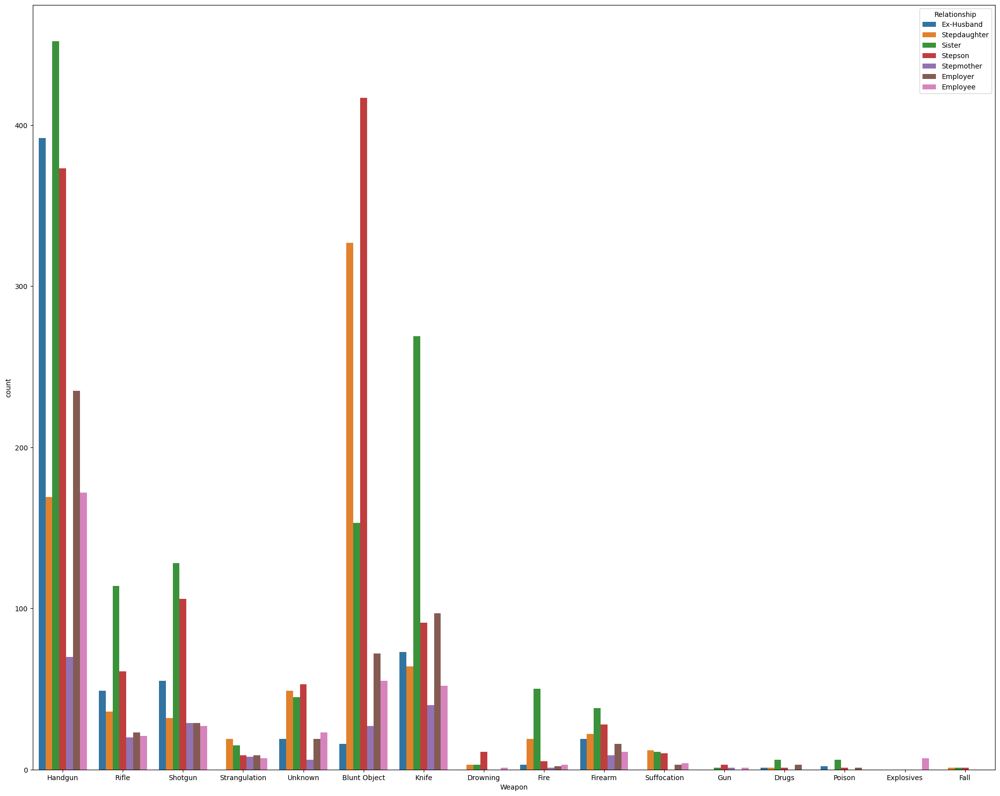

In [86]:
plt.figure(figsize = [25, 20])
sns.countplot(data = relationships4_df, x = 'Weapon', hue = 'Relationship')

In [87]:
relationships_df = df.groupby(['Relationship', 'Weapon']).size()

In [88]:
relationships_df = relationships_df.reset_index(name = 'count')
relationships_df

,Relationship,Weapon,count
0,Acquaintance,Blunt Object,13681
1,Acquaintance,Drowning,135
2,Acquaintance,Drugs,373
3,Acquaintance,Explosives,55
4,Acquaintance,Fall,53
...,...,...,...
402,Wife,Rifle,1432
403,Wife,Shotgun,2259
404,Wife,Strangulation,500
405,Wife,Suffocation,207


In [89]:
relationships_df = relationships_df.pivot(index = 'Relationship', columns = 'Weapon', values = 'count')

In [90]:
relationships_df

Weapon,Blunt Object,Drowning,Drugs,Explosives,Fall,Fire,Firearm,Gun,Handgun,Knife,Poison,Rifle,Shotgun,Strangulation,Suffocation,Unknown
Relationship,,,,,,,,,,,,,,,,
Acquaintance,13681.0,135.0,373.0,55.0,53.0,965.0,4709.0,319.0,62674.0,24469.0,72.0,5636.0,8028.0,1196.0,447.0,3206.0
Boyfriend,222.0,NaN,33.0,5.0,2.0,42.0,135.0,13.0,2566.0,3595.0,5.0,195.0,263.0,20.0,11.0,195.0
Boyfriend/Girlfriend,231.0,4.0,4.0,NaN,NaN,8.0,19.0,NaN,344.0,573.0,5.0,24.0,35.0,74.0,15.0,47.0
Brother,400.0,9.0,10.0,10.0,2.0,63.0,191.0,21.0,2096.0,1446.0,NaN,485.0,642.0,14.0,17.0,108.0
Common-Law Husband,57.0,NaN,2.0,NaN,NaN,12.0,38.0,NaN,728.0,915.0,2.0,77.0,88.0,4.0,NaN,31.0
Common-Law Wife,370.0,3.0,2.0,1.0,2.0,20.0,70.0,4.0,1049.0,475.0,1.0,138.0,185.0,46.0,15.0,96.0
Daughter,2965.0,254.0,109.0,20.0,7.0,315.0,113.0,4.0,1119.0,428.0,44.0,137.0,184.0,130.0,545.0,1165.0
Employee,55.0,1.0,NaN,7.0,NaN,3.0,11.0,1.0,172.0,52.0,NaN,21.0,27.0,7.0,4.0,23.0
Employer,72.0,NaN,3.0,NaN,NaN,2.0,16.0,NaN,235.0,97.0,1.0,23.0,29.0,9.0,3.0,19.0


<Axes: xlabel='Weapon', ylabel='Relationship'>

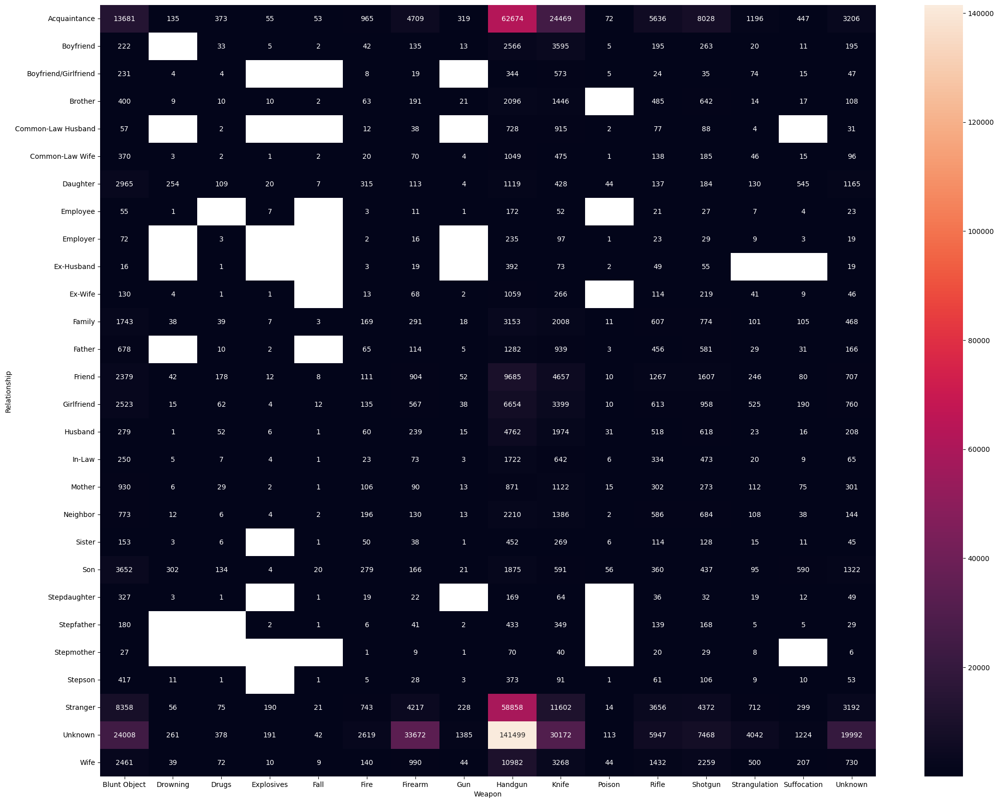

In [91]:
plt.figure(figsize = [25, 20])

sns.heatmap(relationships_df, annot=True, fmt='.0f')

c:\Users\HITECH\OneDrive - ptuk.edu.ps\Apps\Computer_Vision\cv\Lib\site-packages\seaborn\axisgrid.py:718: UserWarning: Using the countplot function without specifying `order` is likely to produce an incorrect plot.
  warnings.warn(warning)


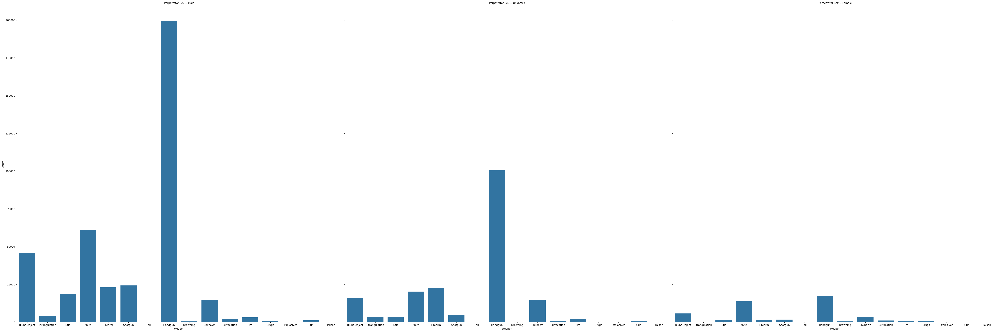

In [92]:
g = sns.FacetGrid(data = df, col = 'Perpetrator Sex', height = 18, col_wrap = 3)
g.map(sns.countplot, 'Weapon');


<Axes: xlabel='Victim Sex', ylabel='Victim Age'>

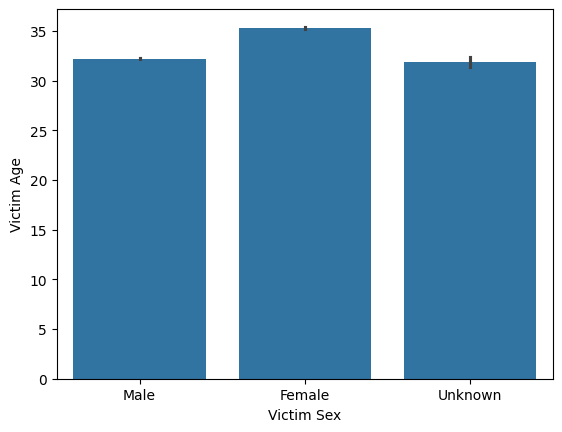

In [93]:
sns.barplot(data=df, x='Victim Sex', y='Victim Age', color='tab:blue')


<Axes: xlabel='Victim Sex', ylabel='Victim Age'>

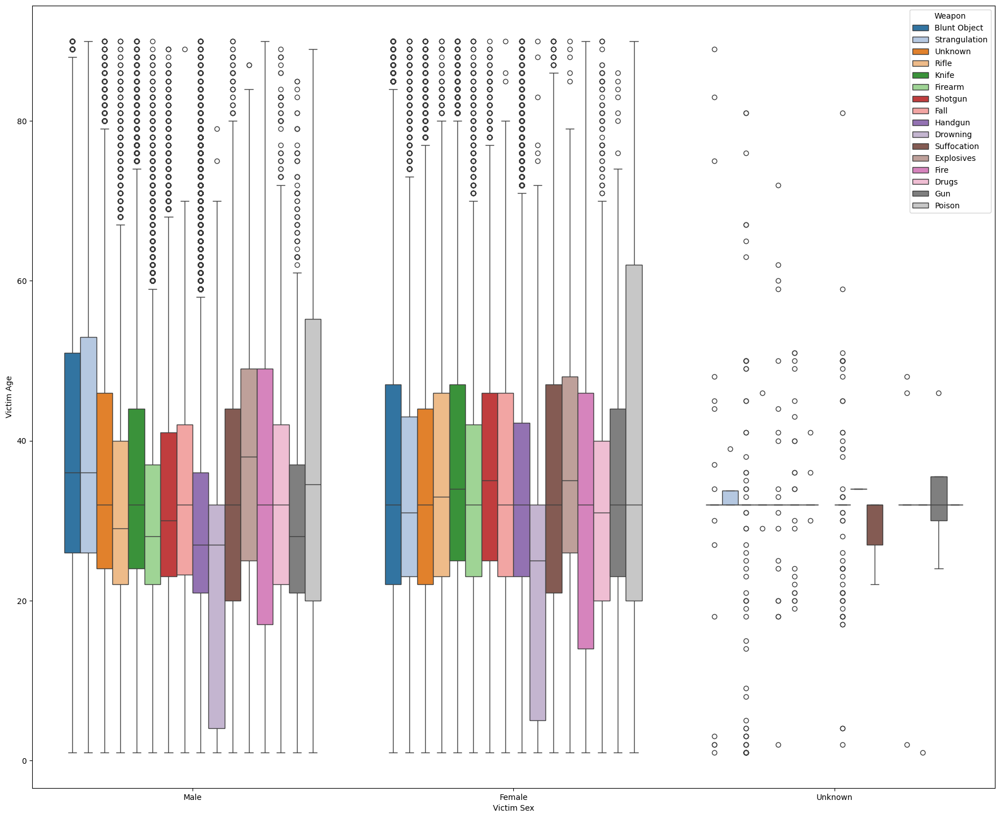

In [94]:
plt.figure(figsize = [22, 18])
sns.boxplot(x = "Victim Sex", y = "Victim Age", data = df, hue = "Weapon", color = '#666666', palette = "tab20")

### Talk about some of the relationships you observed in this part of the investigation. How did the feature(s) of interest vary with other features in the dataset?



### Did you observe any interesting relationships between the other features (not the main feature(s) of interest)?



## Multivariate Exploration



In [95]:
city_largest.dtypes

City     object
count     int64
dtype: object

In [96]:
df['City']

0          Anchorage
1          Anchorage
2          Anchorage
3          Anchorage
4          Anchorage
             ...    
638449          Park
638450      Sheridan
638451      Sheridan
638452      Sublette
638453    Sweetwater
Name: City, Length: 638454, dtype: object

In [97]:
city = df[df['City'].isin(city_largest['City'])]
city

,Unnamed: 0.1,Unnamed: 0,Agency Name,City,State,Year,Month,Crime Solved,Victim Sex,Victim Age,Victim Race,Victim Ethnicity,Perpetrator Sex,Perpetrator Age,Perpetrator Race,Perpetrator Ethnicity,Relationship,Weapon
47,47,47,Jefferson,Jefferson,Alabama,1980,February,1,Male,58,Black,Unknown,Male,43,Black,Unknown,Neighbor,Rifle
48,48,48,Jefferson,Jefferson,Alabama,1980,March,1,Male,43,White,Unknown,Female,38,White,Unknown,Husband,Shotgun
49,49,49,Jefferson,Jefferson,Alabama,1980,April,1,Male,26,Black,Unknown,Male,66,Black,Unknown,Acquaintance,Handgun
50,50,50,Jefferson,Jefferson,Alabama,1980,May,1,Male,17,White,Unknown,Male,40,White,Unknown,Stranger,Handgun
51,51,51,Jefferson,Jefferson,Alabama,1980,June,1,Male,24,White,Unknown,Female,23,White,Unknown,Husband,Handgun
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
638399,638399,638399,Marion County,Marion,West Virginia,2014,September,1,Male,54,White,Unknown,Male,52,White,Unknown,Family,Blunt Object
638420,638420,638420,Wayne County,Wayne,West Virginia,2014,March,1,Male,57,White,Unknown,Male,42,White,Unknown,Acquaintance,Unknown
638421,638421,638421,Wayne County,Wayne,West Virginia,2014,November,1,Male,77,White,Unknown,Male,20,White,Unknown,Acquaintance,Knife
638431,638431,638431,State Police: Wayne,Wayne,West Virginia,2014,June,1,Female,59,White,Unknown,Male,22,White,Unknown,Family,Blunt Object


c:\Users\HITECH\OneDrive - ptuk.edu.ps\Apps\Computer_Vision\cv\Lib\site-packages\IPython\core\events.py:82: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  func(*args, **kwargs)
c:\Users\HITECH\OneDrive - ptuk.edu.ps\Apps\Computer_Vision\cv\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


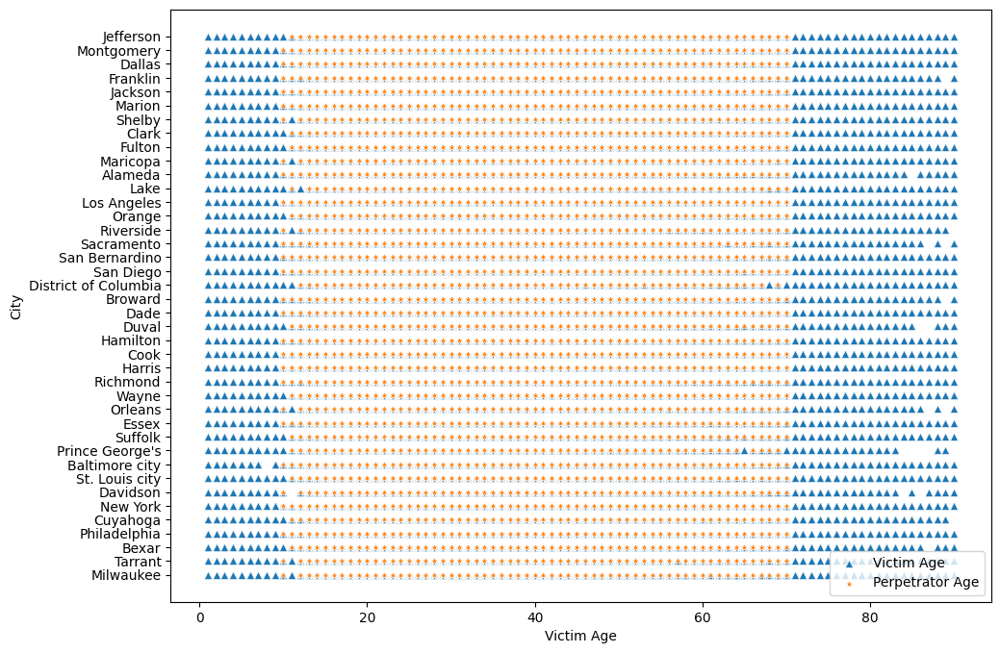

In [98]:
plt.figure(figsize= (11, 8))

ax = sns.scatterplot(data = city, y = 'City', x = 'Victim Age', marker = '^')


sns.scatterplot(data = city, y = 'City', x = 'Perpetrator Age', marker = '*', ax = ax)
plt.legend(['Victim Age', 'Perpetrator Age']);



**Observations of Scatter plot Victim Age Vs City and Perpetrator Age Vs City**
* *Overall Distribution Similarity:cThe distributions of both victim and perpetrator ages across different cities exhibit a similar overall pattern, suggesting that the general age dynamics in these homicide cases are consistent across locations.
* *Range of Ages*: Perpetrator Age: The age distribution of perpetrators is more concentrated, predominantly ranging from early adolescence (around 12 years old) to middle age (in the 50s). This suggests that the majority of perpetrators fall within a relatively narrow age range, indicating a potential demographic pattern in criminal behavior.
* *Victim Age*: In contrast, the age distribution of victims is much broader, spanning from infancy (age 0) to advanced age (late 90s). This wide range indicates that victims of homicide can be of any age, reflecting the indiscriminate nature of violence in these cases.

c:\Users\HITECH\OneDrive - ptuk.edu.ps\Apps\Computer_Vision\cv\Lib\site-packages\IPython\core\events.py:82: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  func(*args, **kwargs)
c:\Users\HITECH\OneDrive - ptuk.edu.ps\Apps\Computer_Vision\cv\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


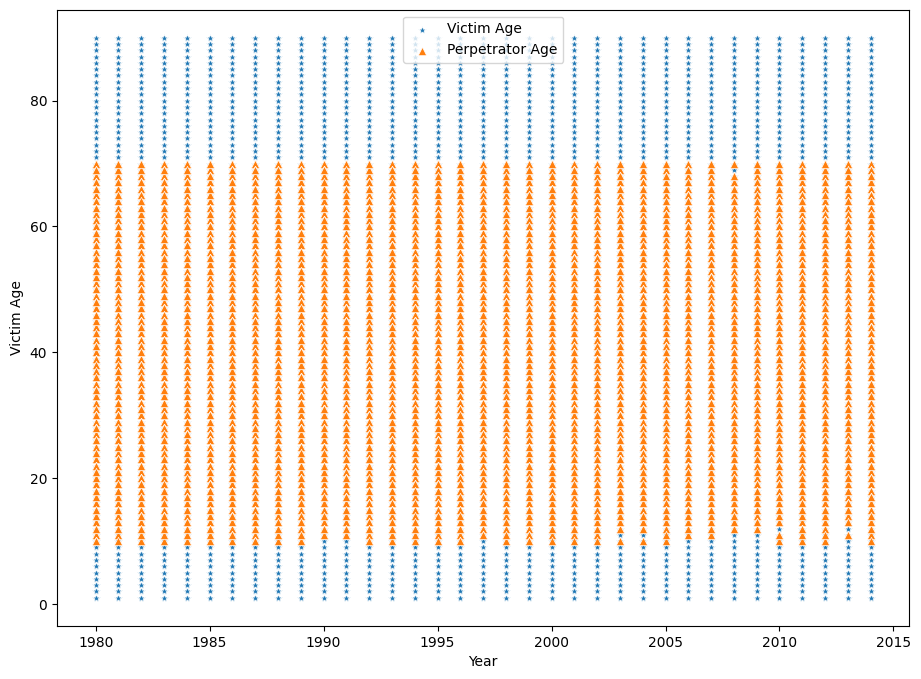

In [99]:
plt.figure(figsize= (11, 8))

ax = sns.scatterplot(data = df, x = 'Year', y = 'Victim Age', marker = '*')


sns.scatterplot(data = city, x = 'Year', y = 'Perpetrator Age', marker = '^', ax = ax)
plt.legend(['Victim Age', 'Perpetrator Age']);

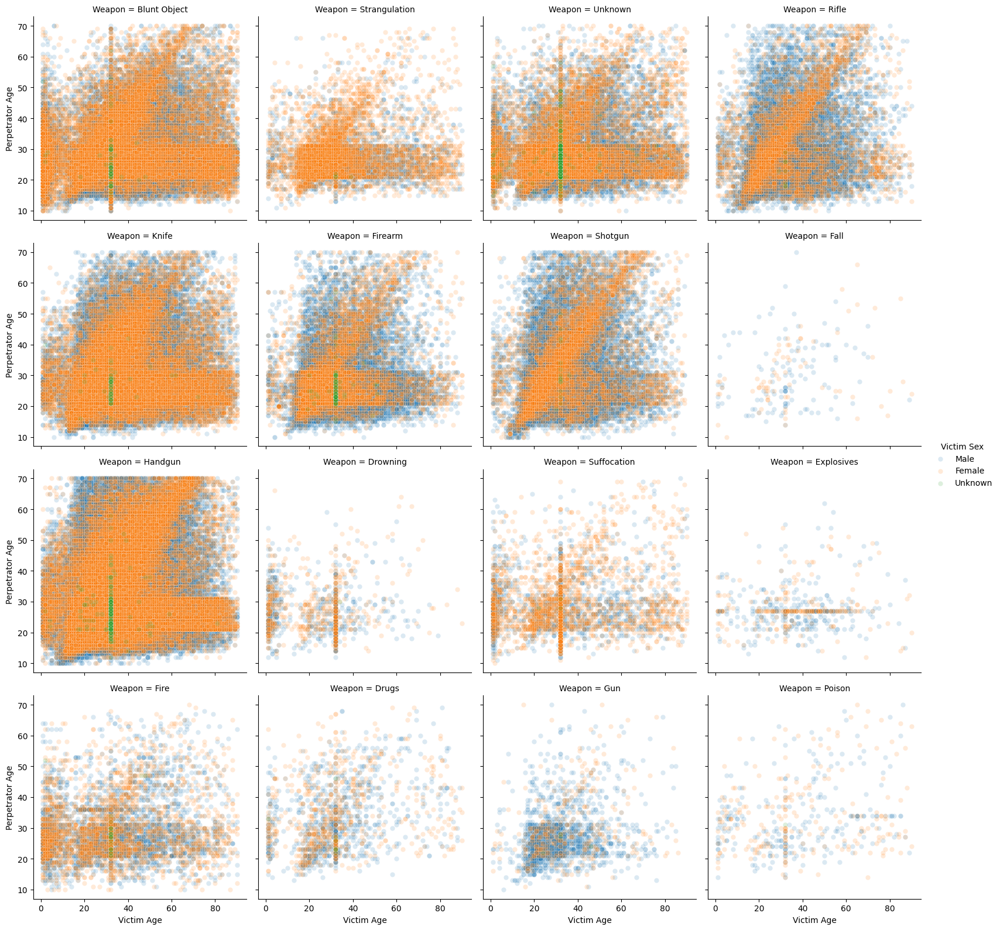

In [100]:
facet = sns.FacetGrid(df, col="Weapon", hue="Victim Sex", height=4, col_wrap=4, margin_titles=True)
facet.map(sns.scatterplot, "Victim Age", "Perpetrator Age", alpha=0.16)
facet.add_legend()
facet.set_axis_labels("Victim Age", "Perpetrator Age")
plt.show()

**Observations**

* *Overall Distribution Similarity Across Weapons*: The scatterplot across most weapon types shows a generally consistent pattern in the age distributions of both victims and perpetrators. This suggests that the age dynamics in homicides are largely similar, regardless of the weapon used. However, some distinctive patterns emerge for specific weapons, particularly when analyzing the data by gender.
* *Weapon = Rifle*:

   * Female Victims: There is a noticeable positive correlation between perpetrator age and victim age among female victims when a rifle is used. This suggests that older perpetrators tend to have older female victims.
   *  Male Victims: The distribution for males using rifles is more widespread, indicating that perpetrators of varying ages are involved in these cases, without a clear age correlation between the perpetrator age and victim age.
  
* *Weapon = Firearm & Shotgun*: Similar to rifles, both firearms and shotguns exhibit a pattern where male victims are more widely distributed across ages, while the female victim age relationship is less dispersed. This indicates that perpetrators are more likely to use these weapons across different age groups on male victims, while the cases involving females show a more specific age-related pattern.
* *Weapon = Explosives*: For female victims using explosives, there is a distinct linear band in the scatterplot around the late 20s on the y-axis (perpetrator age). This linearity suggests that female victims in their late 20s are consistently involved in cases where explosives are used, possibly indicating a demographic concentration or specific circumstances related to this weapon type.
* *Weapon = Drowning & Suffocation*: Both drowning and suffocation display unique vertical lines for female victims on the x-axis (Victim Age) at two specific age ranges: one at age 0 (infants) and another between ages 34-36. These vertical lines suggest that female victims in these specific age groups are particularly vulnerable to drowning and suffocation, perhaps reflecting certain demographic or situational vulnerabilities.

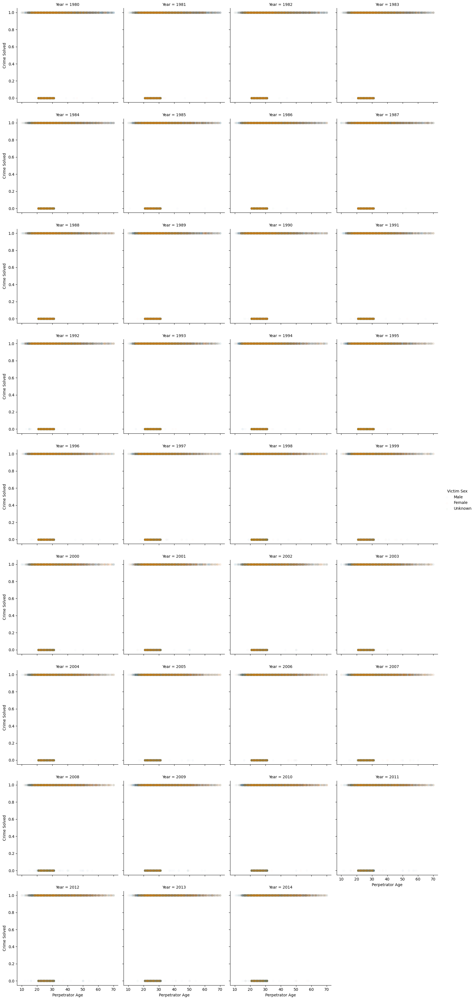

In [101]:
facet = sns.FacetGrid(df, col="Year", hue="Victim Sex", height=4, col_wrap=4, margin_titles=True)
facet.map(sns.scatterplot, "Perpetrator Age", "Crime Solved", alpha=0.015)
facet.add_legend()
facet.set_axis_labels("Perpetrator Age", "Crime Solved")
plt.show()

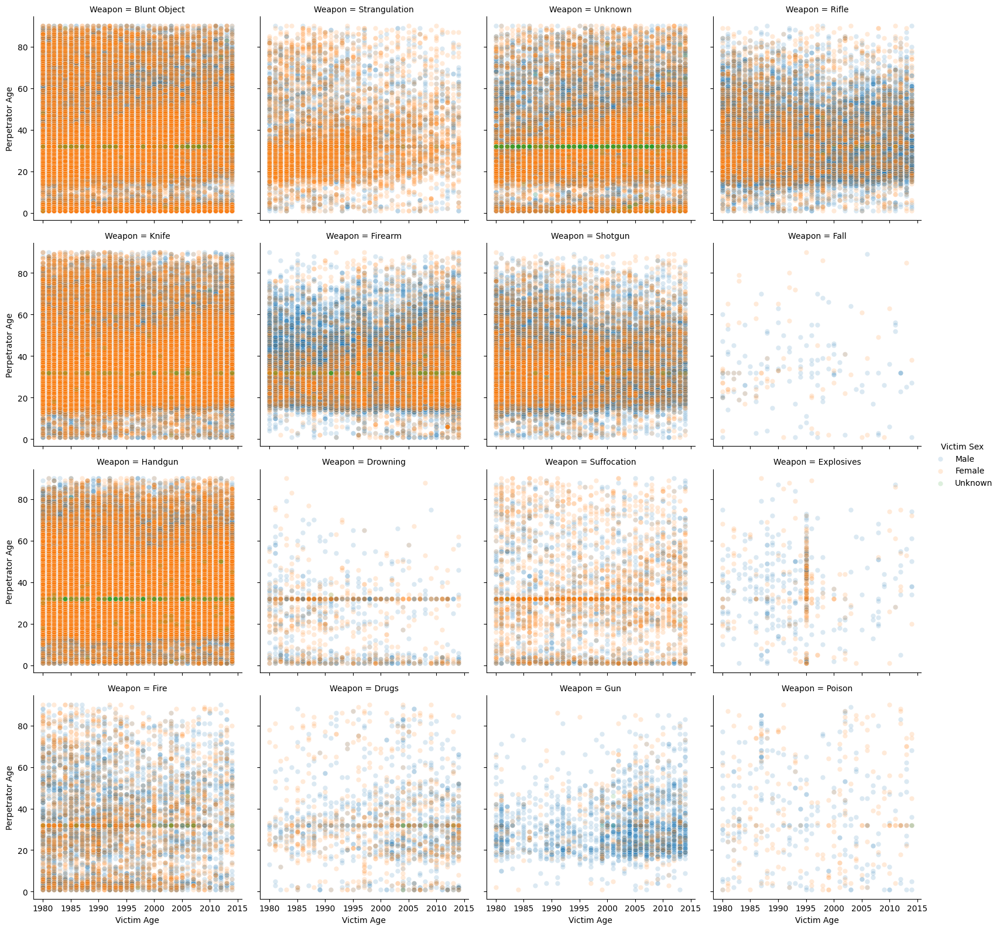

In [102]:
facet = sns.FacetGrid(df, col="Weapon", hue="Victim Sex", height=4, col_wrap=4, margin_titles=True)
facet.map(sns.scatterplot, 'Year', "Victim Age", alpha=0.16)
facet.add_legend()
facet.set_axis_labels("Victim Age", "Perpetrator Age")
plt.show()

In [103]:
smaples = df.sample(5000, replace = False, random_state=5)

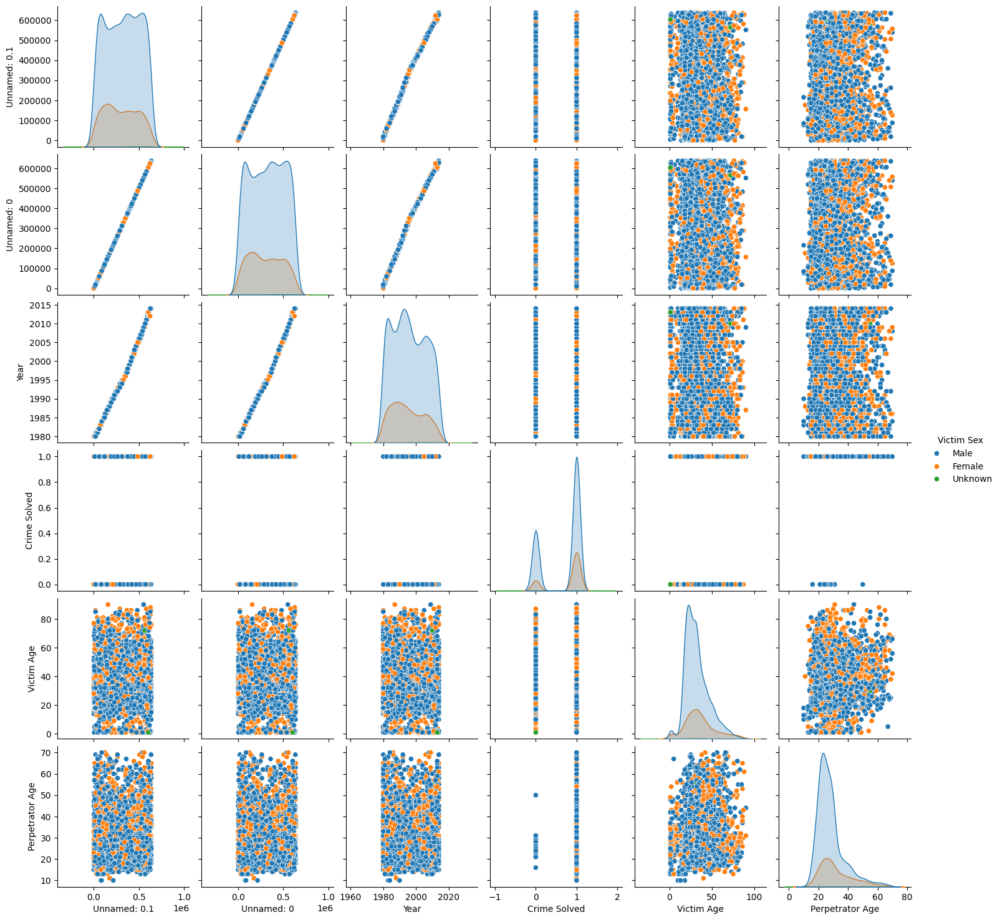

In [104]:
sns.pairplot(smaples, hue = 'Victim Sex')

In [105]:
cleaned_data = df.to_csv("cleaned_data.csv", index = False)

**Conclusion**


Through a detailed analysis of the homicide data, several critical insights have emerged, highlighting patterns in victim and perpetrator demographics, weapon usage, and geographic distribution. These findings provide a deeper understanding of the dynamics surrounding homicides, particularly in relation to age, gender, and location.

**Key Findings**:


1- Temporal Patterns:

* *Peak Homicide Records*: The period from 1992 to 1993 witnessed the highest number of homicide records, indicating a significant spike in violent crimes during these years.
Geographic Distribution:

2- High Homicide Cities: Los Angeles and New York stand out as the cities with the highest number of homicides, likely due to their large populations and urban density.

3- State-Level Insights:
  * California: This state recorded the highest number of homicides, reflecting its large population and numerous major cities.
  * Texas and New York: Both states closely follow California, also reflecting significant urban populations and associated crime rates.
  * Low Homicide States: States like North Dakota and Vermont show significantly lower homicide counts, indicative of their smaller populations and more rural settings.

4- Victim and Perpetrator Age Dynamics:

  * Victim Age Distribution: The highest frequency of victims falls between the early 20s and early 30s, with notable peaks at ages 32, 22, 20, 25, and 21. This suggests that individuals in this age group are particularly vulnerable to homicide.
  * A decline in victim numbers is observed beyond the early 30s, which is expected as population size decreases in older age groups.
  * Elderly victims (ages 88-90) are rare, reflecting their smaller population size and lower involvement in violent crime.
* Perpetrator Age Distribution: The most frequent ages for perpetrators are between 20 and 30, with age 21 being the most common. The frequency drops sharply after age 30, with very few perpetrators above age 50.


5- Weapon Usage:

  * Handguns are the most commonly used weapon in homicides.
  * Rifles, Firearms, and Shotguns: These weapons show a pattern where male victims are more widely distributed across ages, while female victims show a more specific age-related pattern.
  * Explosives: There is a distinct concentration of female victims in their late 20s, suggesting a demographic concentration.
  * Drowning & Suffocation: These methods exhibit unique age-related patterns, particularly for female victims, with specific vulnerabilities observed in infants and adults aged 34-36.
6- Victim-Perpetrator Relationships: The most common relationships between victims and perpetrators are "Acquaintance" and "Stranger," indicating that investigators often start with people who know the victim.

7- Gender-Specific Patterns:

  * Male Victims: Perpetrators of male victims tend to be younger adults, predominantly aged 18-32 years.
  * Female Victims: Female victims show a broader distribution in the ages of perpetrators, extending into the late 30s and beyond, indicating that females may be more at risk from a wider age range of perpetrators.


**Limitations and Further Investigation**:
* Data Coverage: The analysis is limited by the time period and geographic scope of the dataset. Expanding the dataset to include more recent years and additional regions could provide more comprehensive insights.
* Gender Analysis: The dataset shows that male perpetrators are predominant, which might obscure patterns among female perpetrators. Further investigation is needed to explore gender-specific trends in greater detail.
  
* Victim-Perpetrator Relationships: While "Acquaintance" and "Stranger" relationships dominate, a deeper dive into less common relationships (e.g., family or intimate partner) could uncover important nuances.
Age Dynamics in Homicides:

The study reveals specific age ranges where both victims and perpetrators are more common. However, further research is needed to understand the underlying causes, such as social, economic, or psychological factors, driving these patterns.